In [ ]:
import matplotlib.pyplot as plt

import os
import pandas as pd
from datetime import datetime
import re

FILTERED_WINDOW = 11

ECG_PERCEMTAGE_START = 0.8

# ECG_WINDOW = int(130 * 0.6)
# PPG_WINDOW = int(55 * 0.6)

# ECG_WINDOW = 130 * 1
# PPG_WINDOW = 55  * 1

# ECG_WINDOW = 130 * 2
# PPG_WINDOW = 55  * 2

ECG_WINDOW = 130 * 4
PPG_WINDOW = 55 * 4

# ECG_WINDOW = 130 * 9
# PPG_WINDOW = 55  * 9

PPG_CHANNEL = 'channel 0'

def generate_column_names(ecg_count, ppg_count):
    # Define column names for ECG and PPG
    ecg_columns = [f'ECG_{i}' for i in range(1, ecg_count + 1)]
    ppg_columns = [f'PPG_{i}' for i in range(1, ppg_count + 1)]

    # Combine both lists and prepend 'Filename'
    column_names = ['Filename'] + ecg_columns + ppg_columns

    return column_names

def repair_PPG(file_path):
    # Read the text file
    with open(file_path, 'r') as file:
        lines = file.readlines()
    
    # Remove trailing semicolons and split each line into data fields
    cleaned_data = []
    for line in lines[1:]:  # Skip the header line
        if line.strip():  # Skip empty lines
            fields = line.strip().rstrip(';').split(';')
            cleaned_data.append(fields)
    
    # Create DataFrame from cleaned data
    column_names = lines[0].strip().split(';')  # Extract column names from header
    df = pd.DataFrame(cleaned_data, columns=column_names)

    # Convert columns to appropriate dtypes
    df[['channel 0', 'channel 1', 'channel 2', 'ambient']] = df[['channel 0', 'channel 1', 'channel 2', 'ambient']].apply(pd.to_numeric)

    df['channel 0'] -= df['ambient']
    df['channel 1'] -= df['ambient']
    df['channel 2'] -= df['ambient']

    df['main_channel'] = df[PPG_CHANNEL]

    df = df.drop(columns=["sensor timestamp [ns]", "channel 0", "channel 1", "channel 2", "ambient"])

    df['Phone timestamp'] = pd.to_datetime(df['Phone timestamp'], format='%Y-%m-%dT%H:%M:%S.%f')

    return df

def parse_filename(filename):
    # Use regex to extract date, name, index, and type
    match = re.match(r"(\d{2}_\d{2}_\d{2})_(\w+)_(\d+)_(ECG|PPG)\.txt", filename)
    if match:
        date_str, name, index, type_ = match.groups()
        date = datetime.strptime(date_str, '%d_%m_%y')
        return date, name, int(index), type_
    else:
        # Handle unexpected filename format
        return None

def get_sorted_files(directory):
    if os.path.exists(directory) and os.path.isdir(directory):
        files = [filename for filename in os.listdir(directory) if os.path.isfile(os.path.join(directory, filename))]
        files = [f for f in files if parse_filename(f)]  # Filter out files with unexpected format
        files.sort(key=lambda x: parse_filename(x))
        return files
    return []

# Specify the paths to polar_data directory
polar_data_dir = 'polar_data'

# Get sorted list of filenames from polar_ECG directory
ecg_dir = os.path.join(polar_data_dir, 'polar_ECG')
ecg_files = get_sorted_files(ecg_dir)

# Get sorted list of filenames from polar_PPG directory
ppg_dir = os.path.join(polar_data_dir, 'polar_PPG')
ppg_files = get_sorted_files(ppg_dir)

# Determine the maximum length between ecg_files and ppg_files
max_length = max(len(ecg_files), len(ppg_files))

merged_dataframe_to_save = pd.DataFrame(columns=generate_column_names(ECG_WINDOW, PPG_WINDOW))

# Iterate through both lists simultaneously
for i in range(max_length):

    ################## ECG ##################

    ECG_data = pd.read_csv(f"polar_data/polar_ECG/{ecg_files[i]}", delimiter=";")

    ECG_data = ECG_data.drop(columns=["sensor timestamp [ns]",	"timestamp [ms]"])

    ECG_data['Phone timestamp'] = pd.to_datetime(ECG_data['Phone timestamp'], format='%Y-%m-%dT%H:%M:%S.%f')

    cut_ECG_data = int(ECG_PERCEMTAGE_START * len(ECG_data))
    start_index_ECG = cut_ECG_data
    end_index_ECG  = start_index_ECG + ECG_WINDOW
    end_index_ECG  = min(end_index_ECG , len(ECG_data))
    ECG_data_window = ECG_data.iloc[start_index_ECG:end_index_ECG]
    ECG_data_window['ecg [uV]'] = ECG_data_window['ecg [uV]'].rolling(window=11, min_periods=1).mean()
    # main_channel_mean = ECG_data_window['ecg [uV]'].mean()
    # ECG_data_window.loc[:, 'ecg [uV]'] = (ECG_data_window['ecg [uV]'] - main_channel_mean).astype('int64')
    # ECG_data_window.loc[:, 'ecg [uV]'] = ECG_data_window['ecg [uV]'].round(3)

    ################## PPG ##################
    
    PPG_data = repair_PPG(f"polar_data/polar_PPG/{ppg_files[i]}")
    PPG_data = PPG_data[PPG_data['Phone timestamp'] >=  ECG_data_window.iloc[0]["Phone timestamp"]]
    PPG_data_window = PPG_data.head(PPG_WINDOW)
    main_channel_mean = PPG_data_window['main_channel'].mean()
    PPG_data_window.loc[:, 'main_channel'] = (PPG_data_window['main_channel'] - main_channel_mean) / 1000
    PPG_data_window.loc[:, 'main_channel'] = PPG_data_window['main_channel'].round(3)
    PPG_data_window['main_channel'] = PPG_data_window['main_channel'].rolling(window=11, min_periods=1).mean()

    # Plot PPG_data_window
    plt.figure(figsize=(10, 6))
    plt.plot(PPG_data_window['Phone timestamp'], PPG_data_window['main_channel'], label='PPG Data')
    # Reduce the number of x-axis labels for readability
    num_ticks = 10  # Number of ticks you want
    ticks = PPG_data_window['Phone timestamp'][::len(PPG_data_window)//num_ticks]
    labels = [tick.strftime('%H:%M:%S') for tick in ticks]  # Format to show only hour and minute


    # plt.plot(PPG_data_window['Phone timestamp'], PPG_data_window['main_channel'], label='PPG Data')
    plt.xlabel('Timestamp')
    plt.ylabel('Main Channel')
    plt.title('PPG Data')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot ECG_data_window
    plt.figure(figsize=(10, 6))
    plt.plot(ECG_data_window['Phone timestamp'], ECG_data_window['ecg [uV]'], label='ECG Data')
       # Reduce the number of x-axis labels for readability
    num_ticks = 10  # Number of ticks you want
    ticks = ECG_data_window['Phone timestamp'][::len(ECG_data_window)//num_ticks]
    labels = [tick.strftime('%H:%M:%S') for tick in ticks]  # Format to show only hour and minute

    plt.ylabel('EKG [uV]')
    plt.xlabel('Phone timestamp [hh:mm:ss]')
    plt.title('Przykładowy wycinek sygnału EKG z oknem filtracji o szerokości 11')
    plt.legend()
    plt.grid(True)
    plt.show()

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


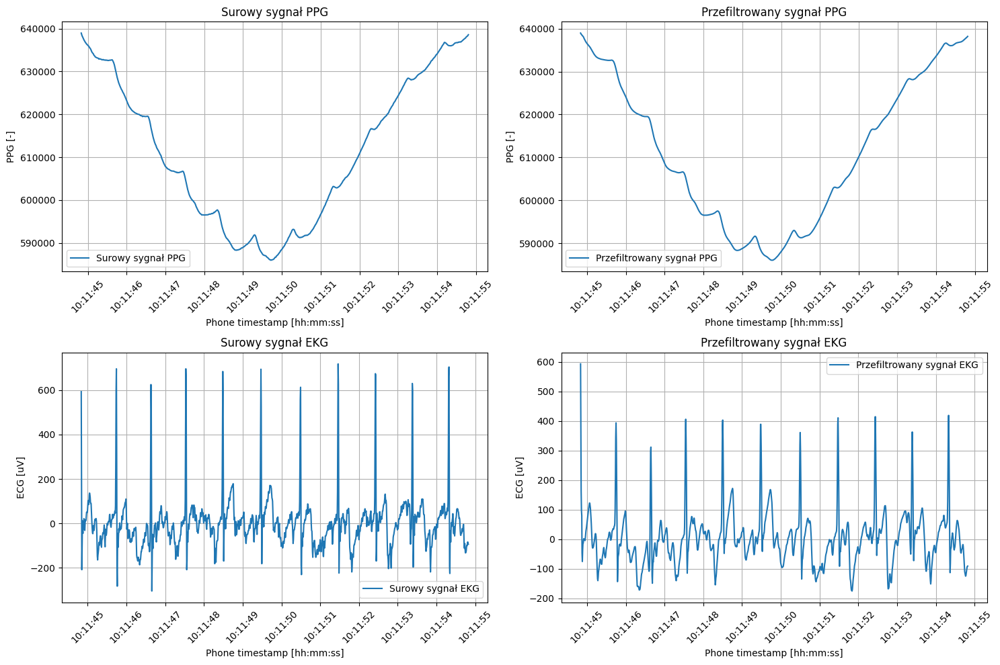

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


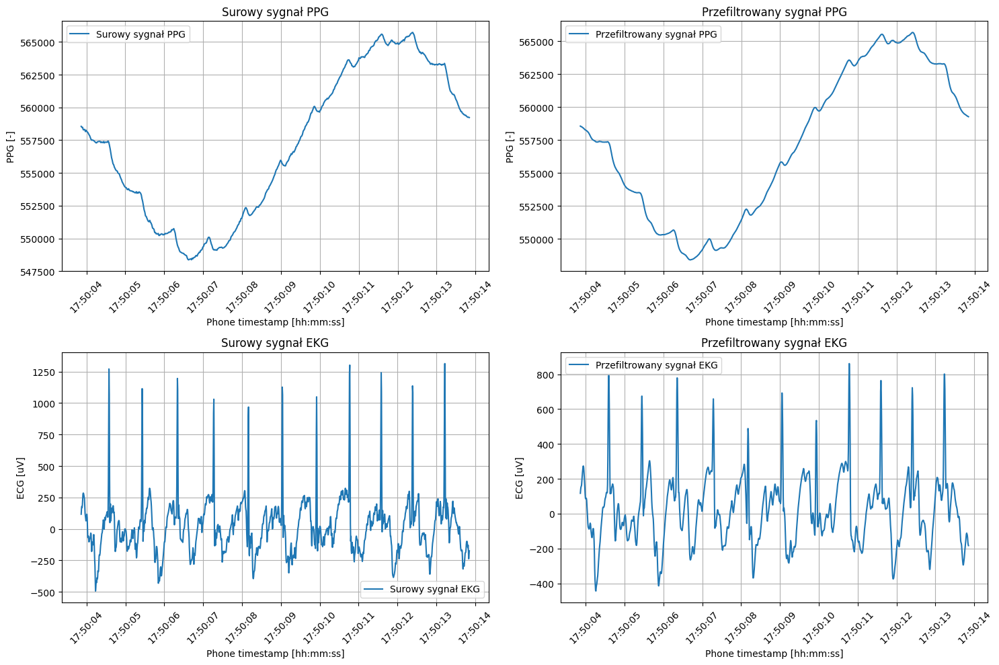

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


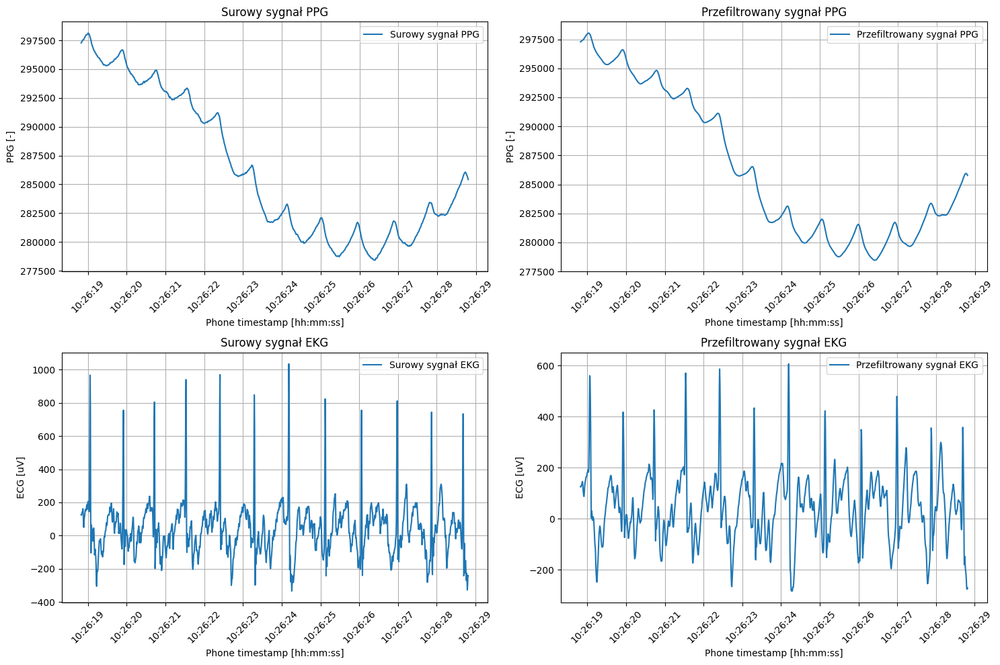

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


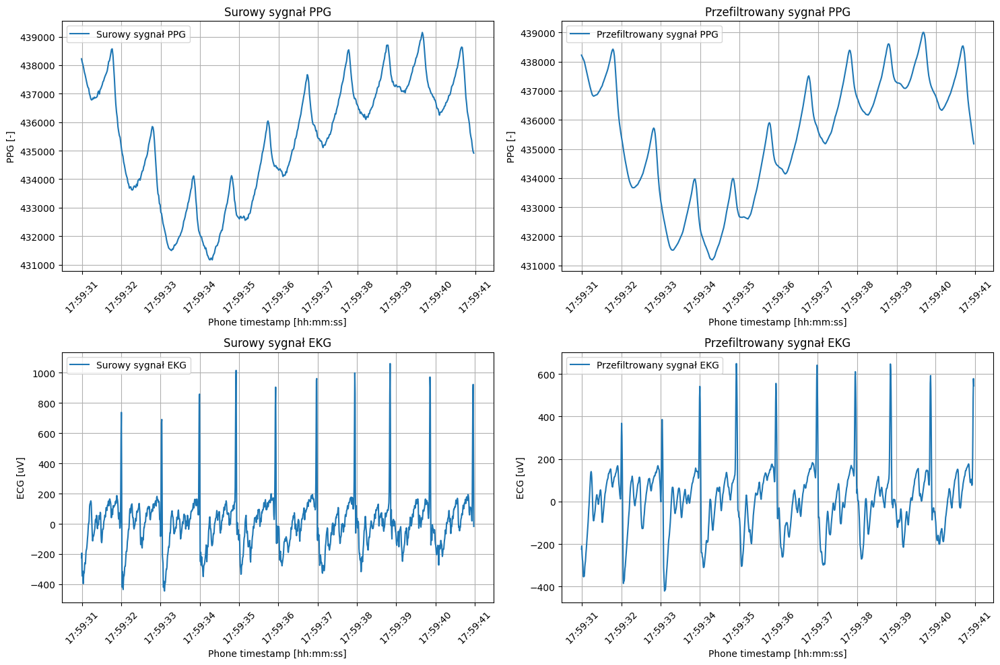

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


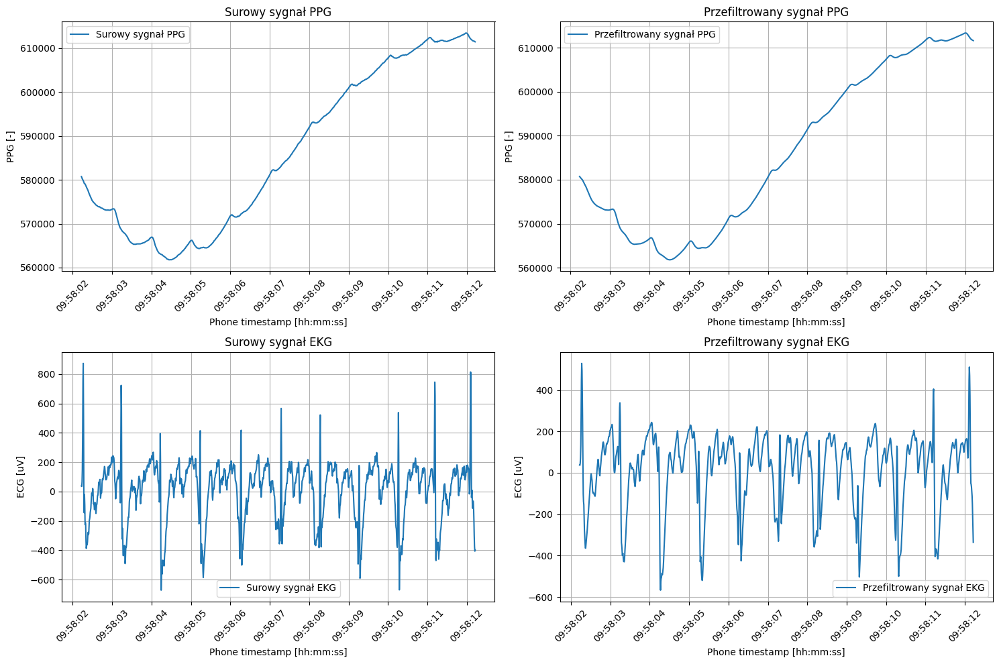

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


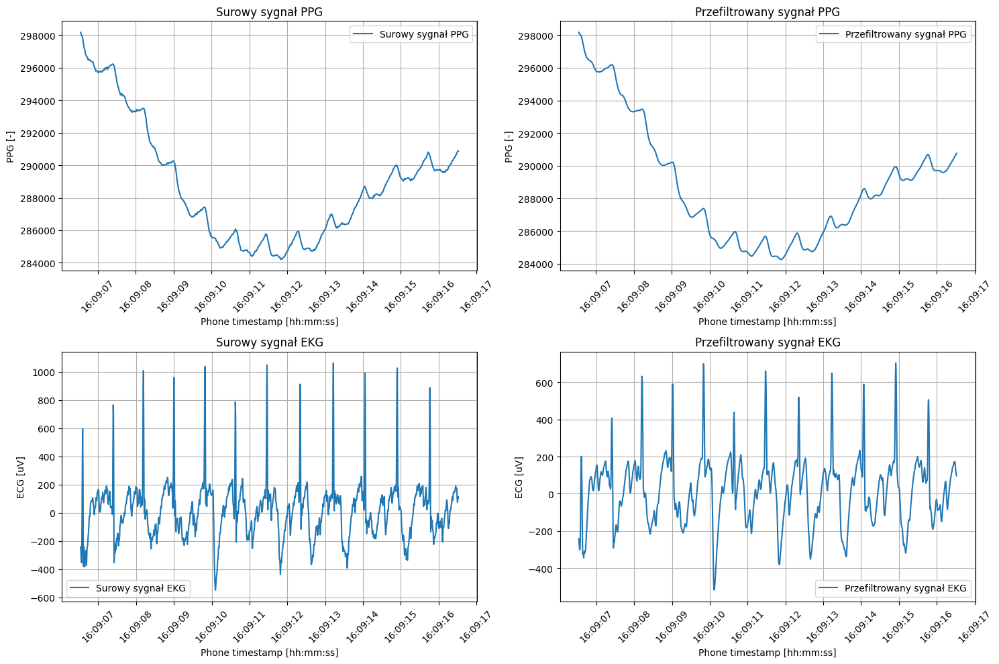

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


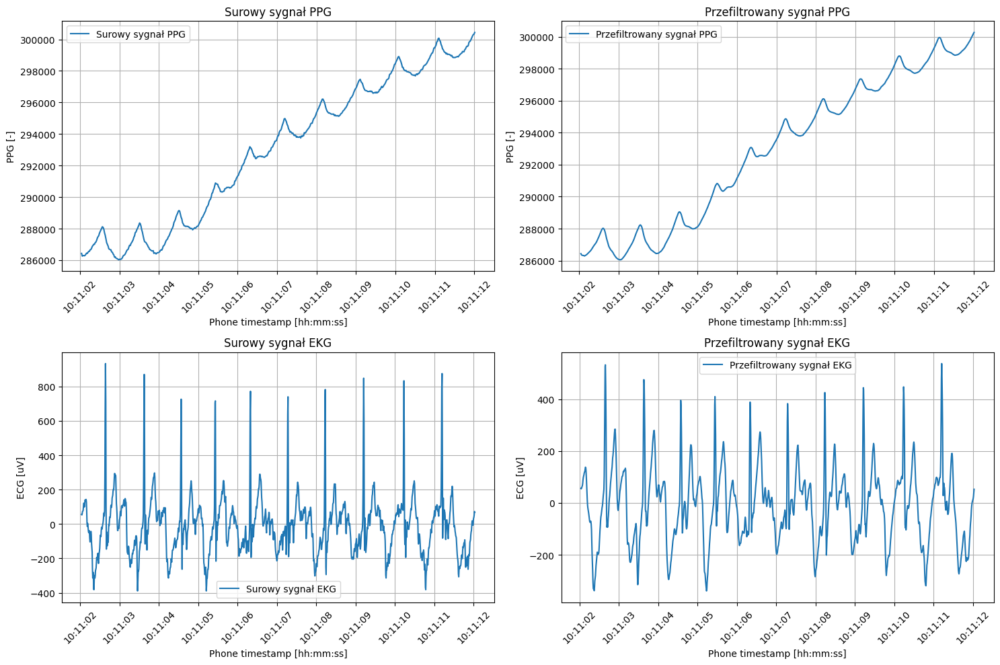

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


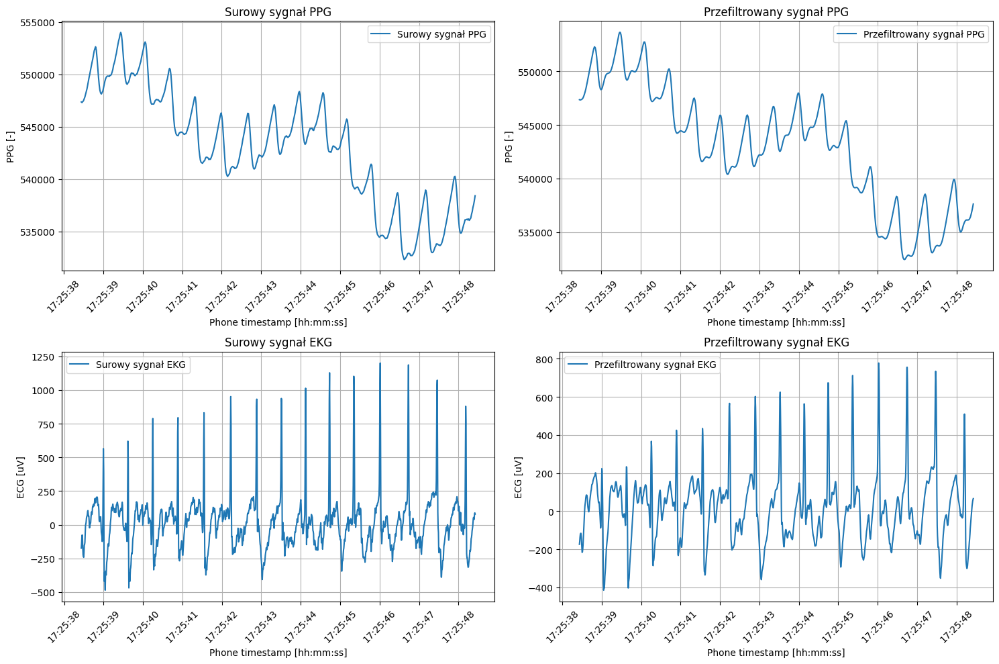

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


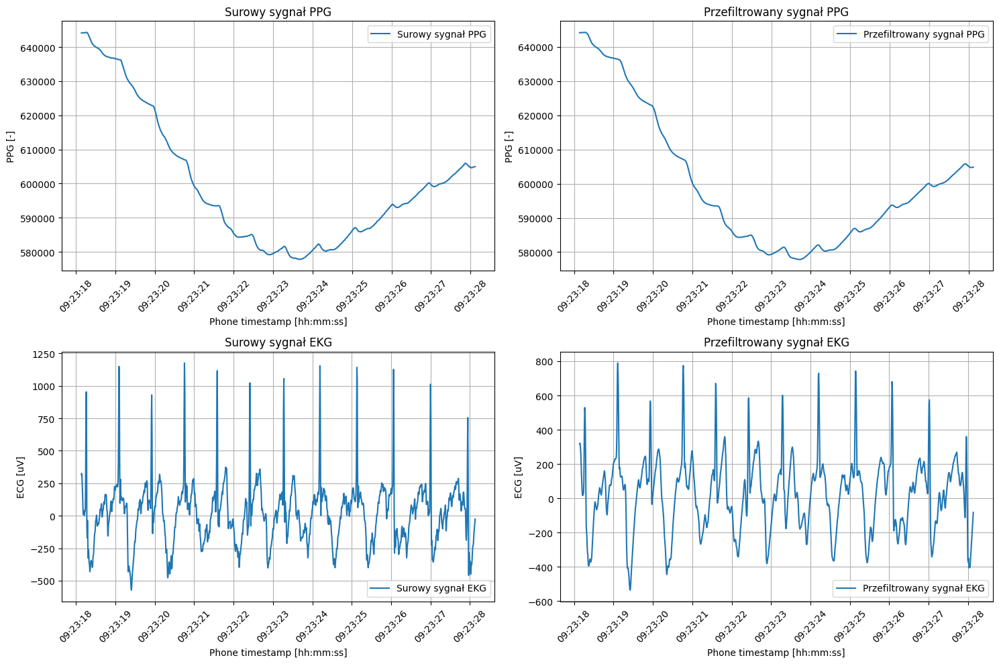

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


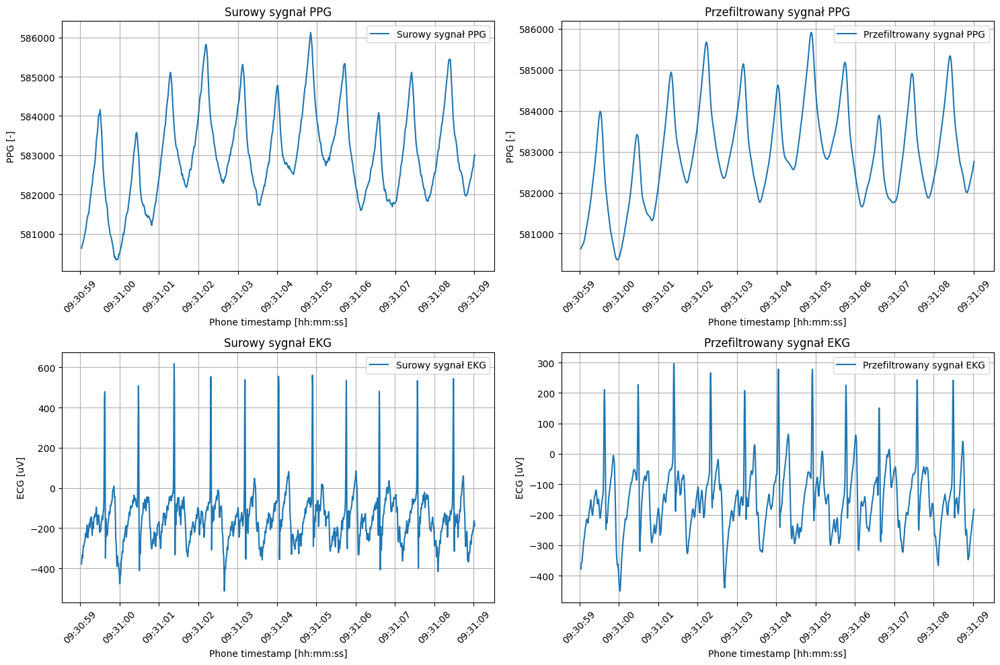

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


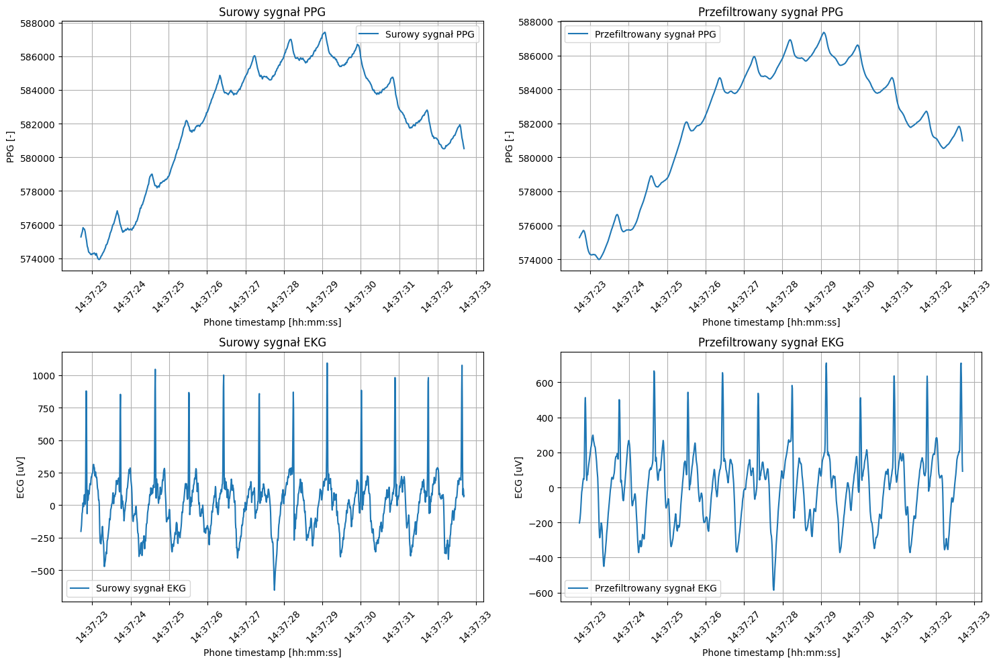

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


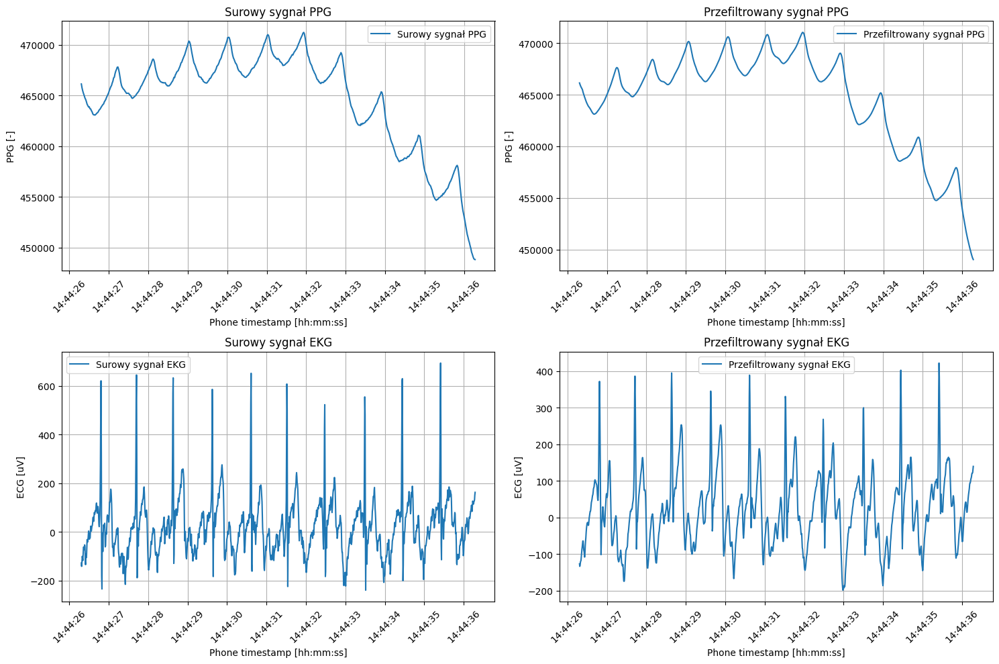

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


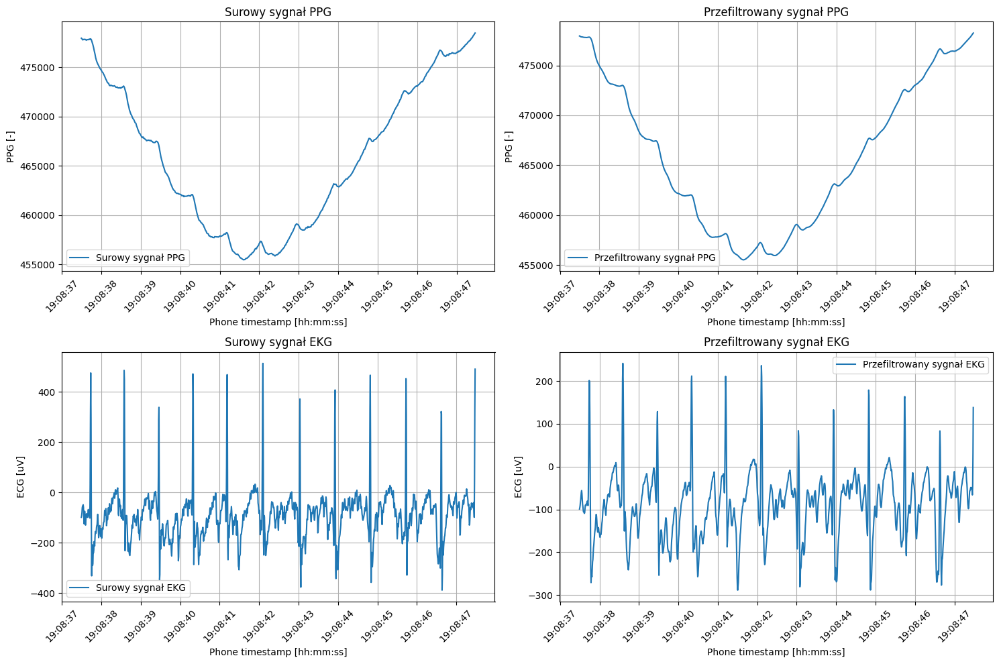

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


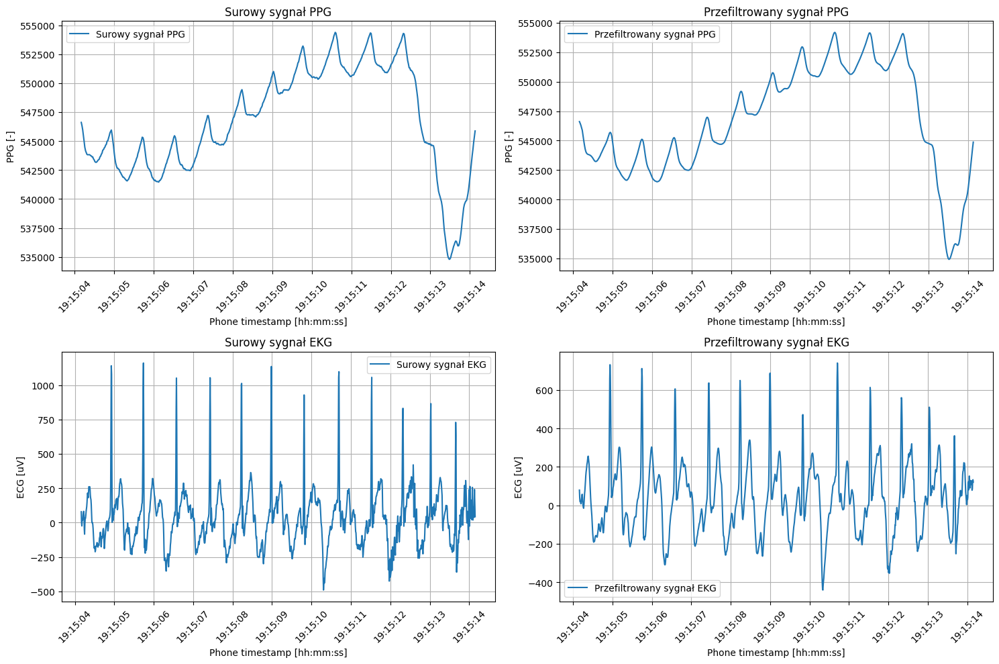

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


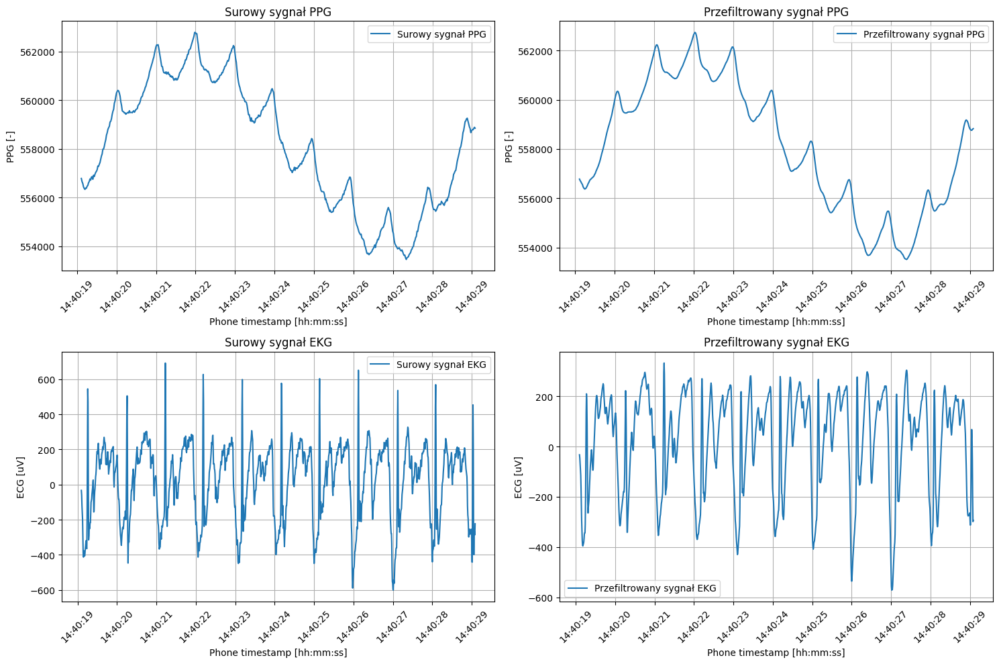

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


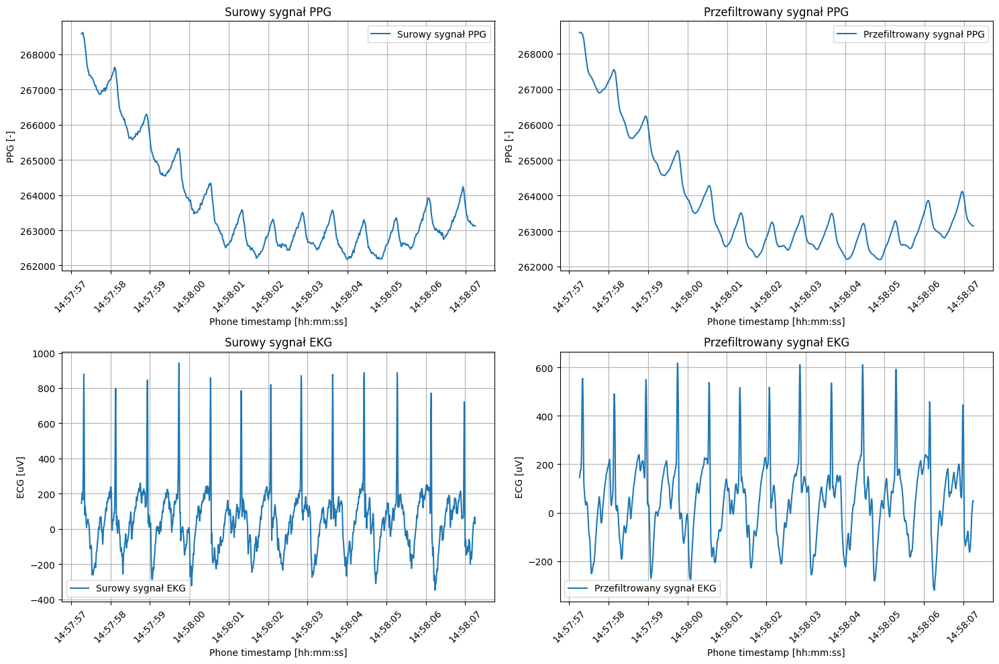

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


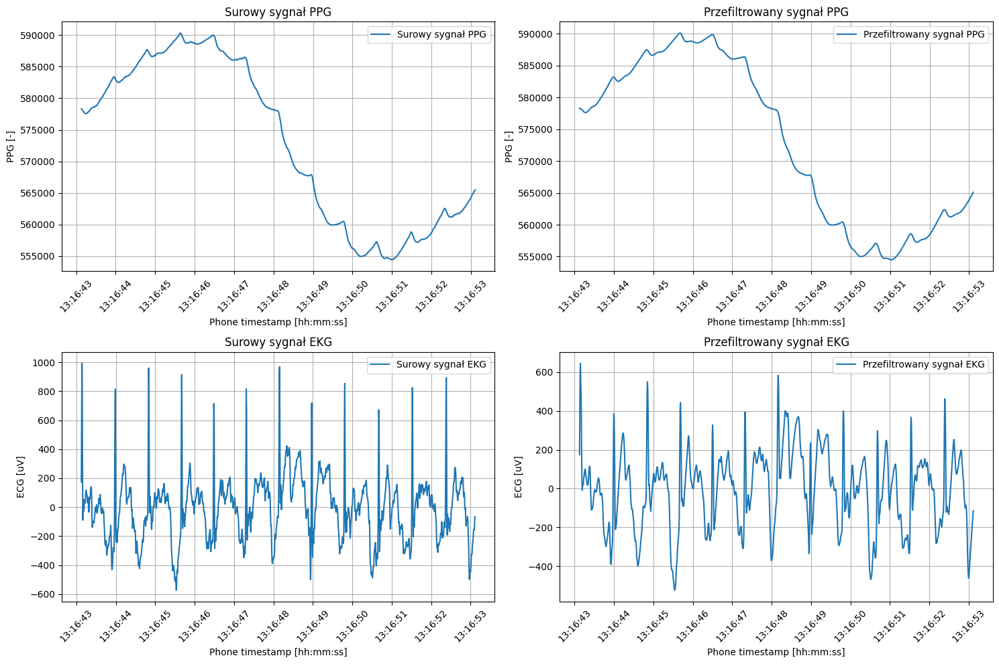

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


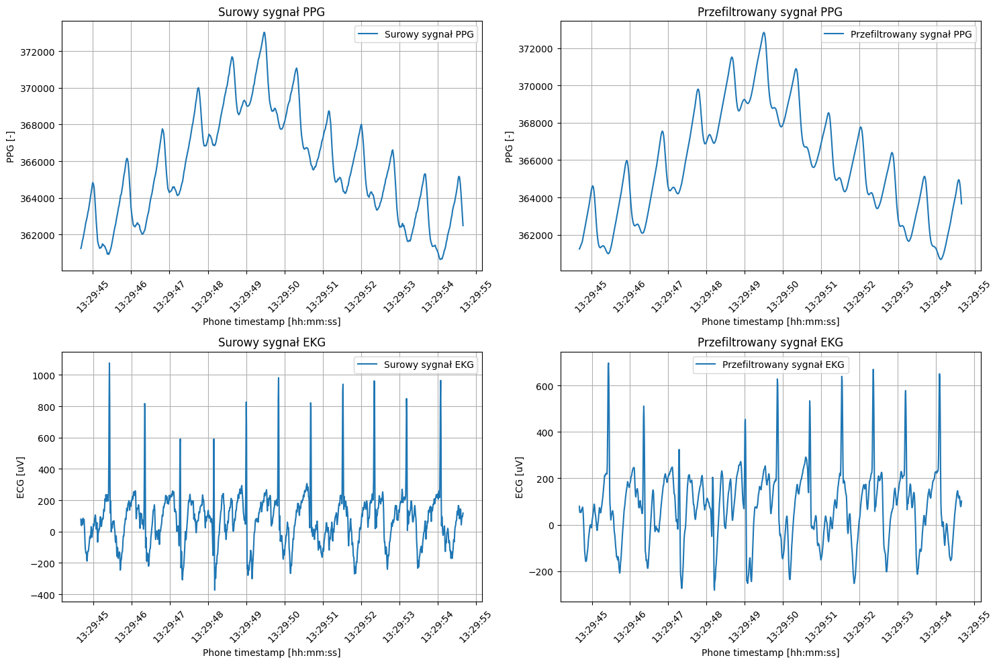

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


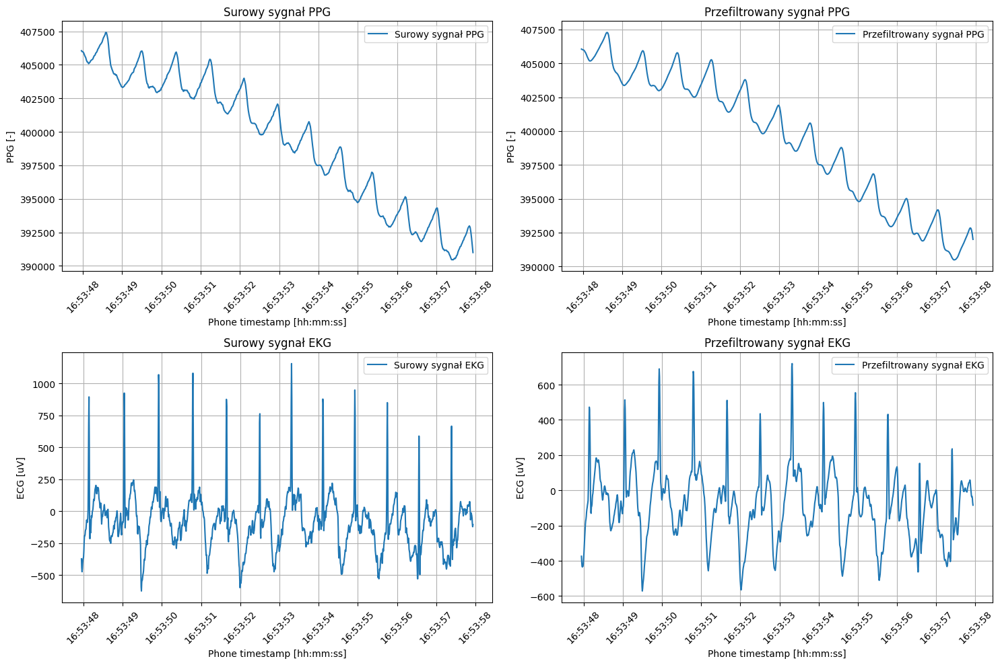

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


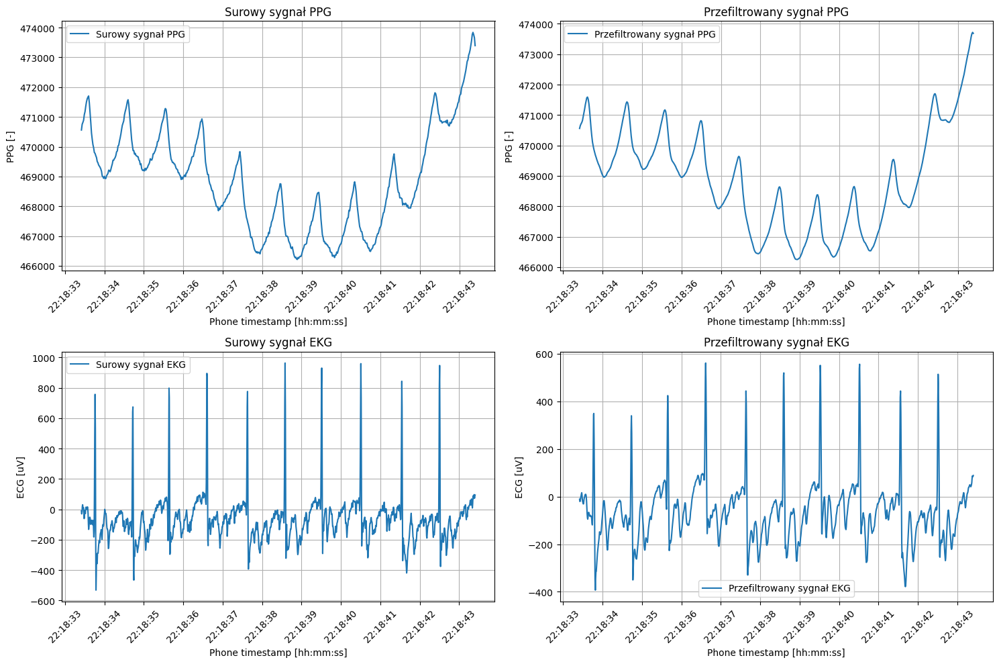

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


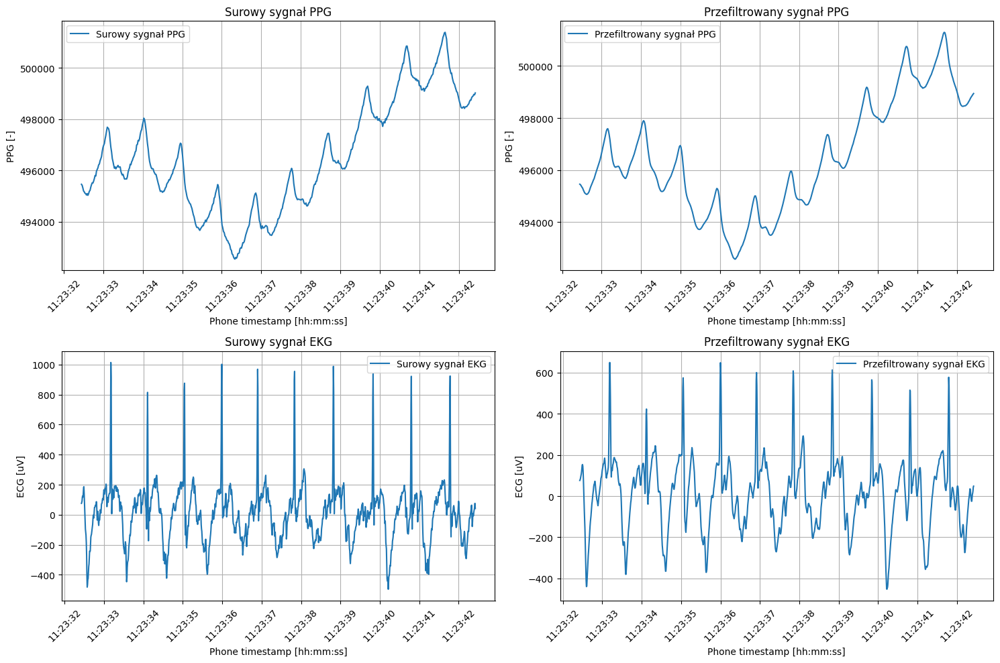

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


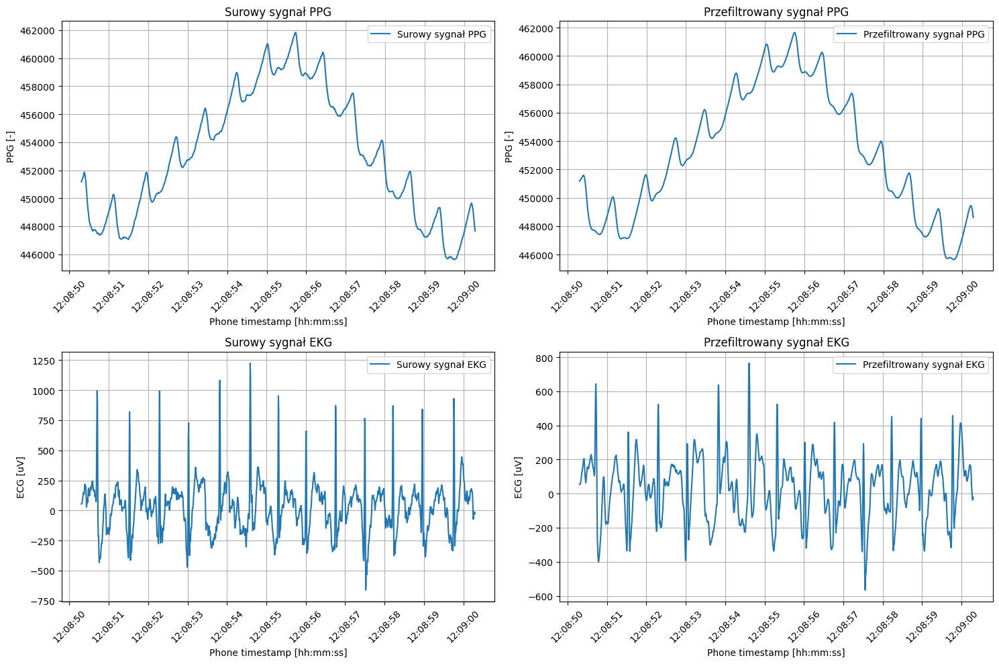

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


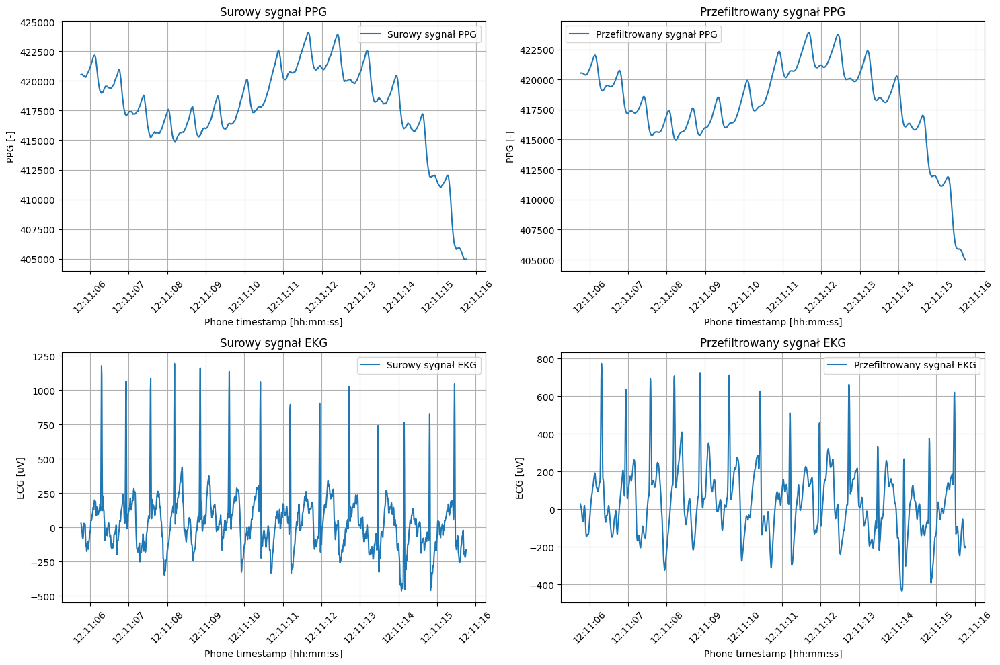

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


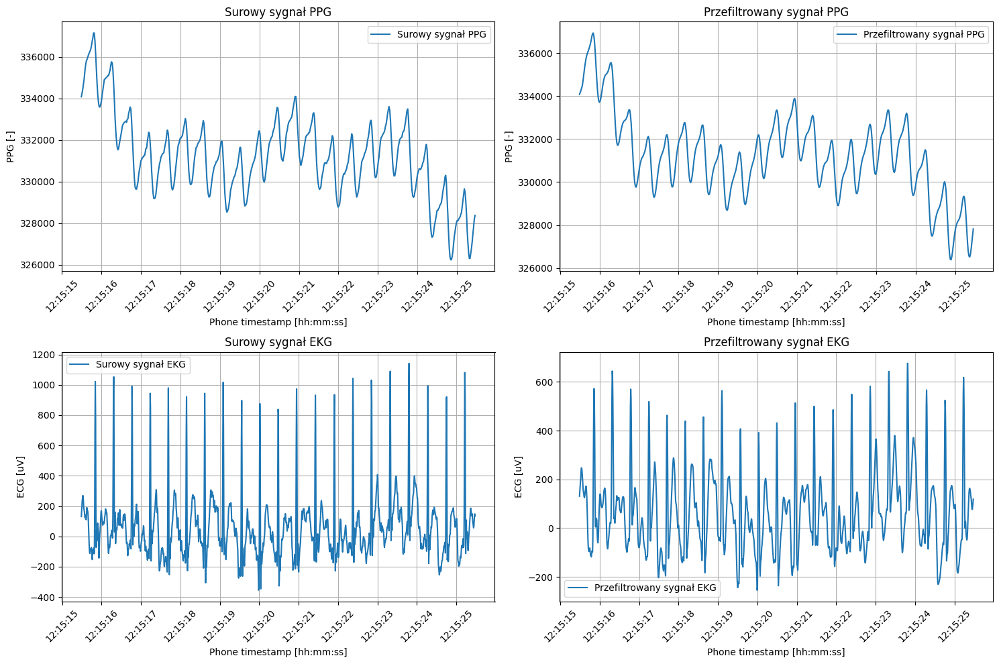

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


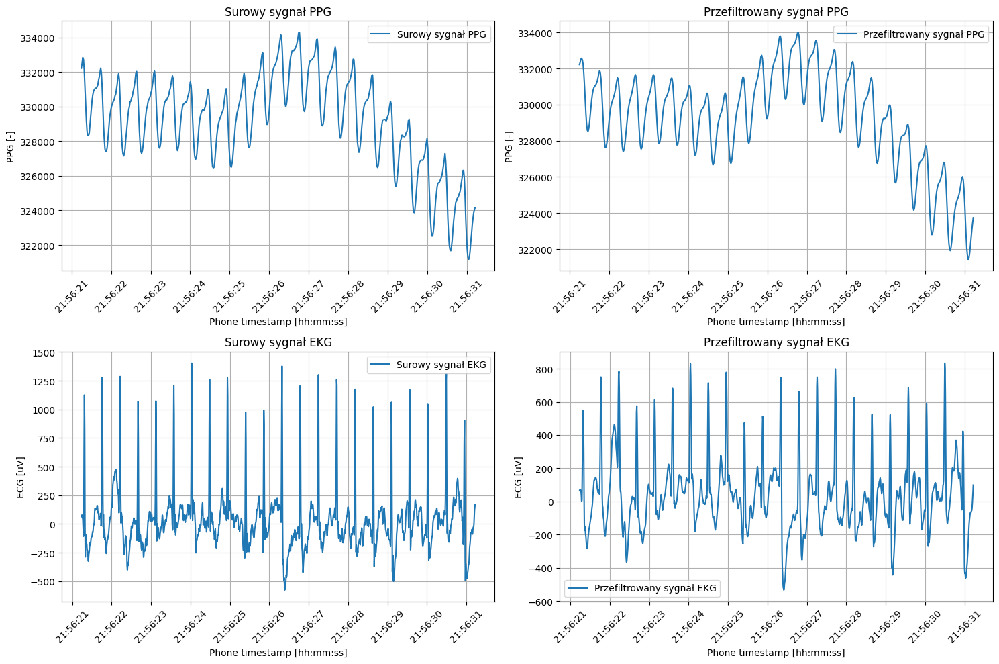

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


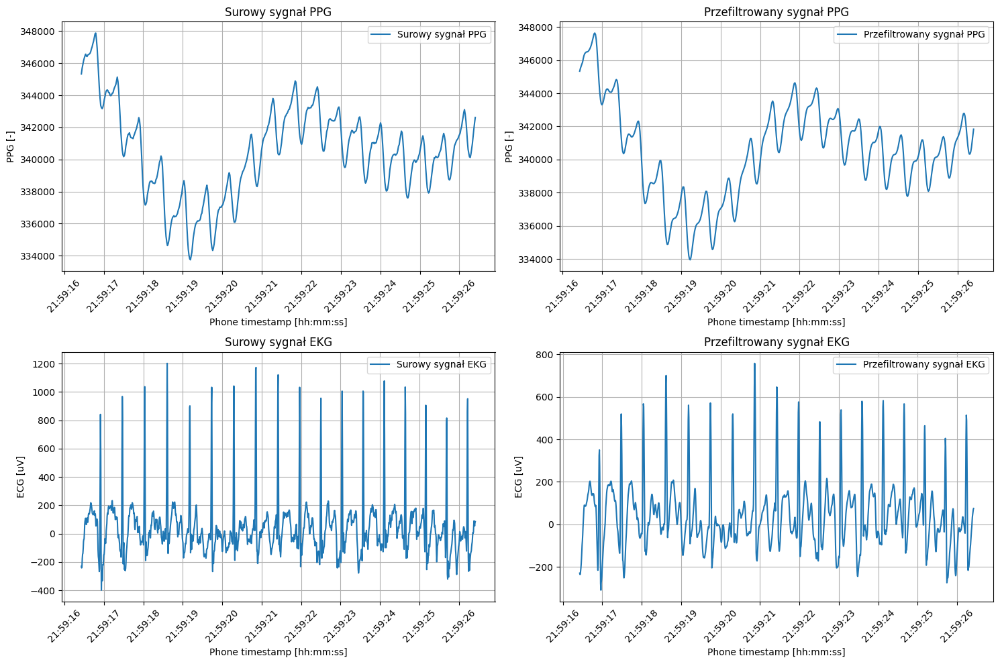

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


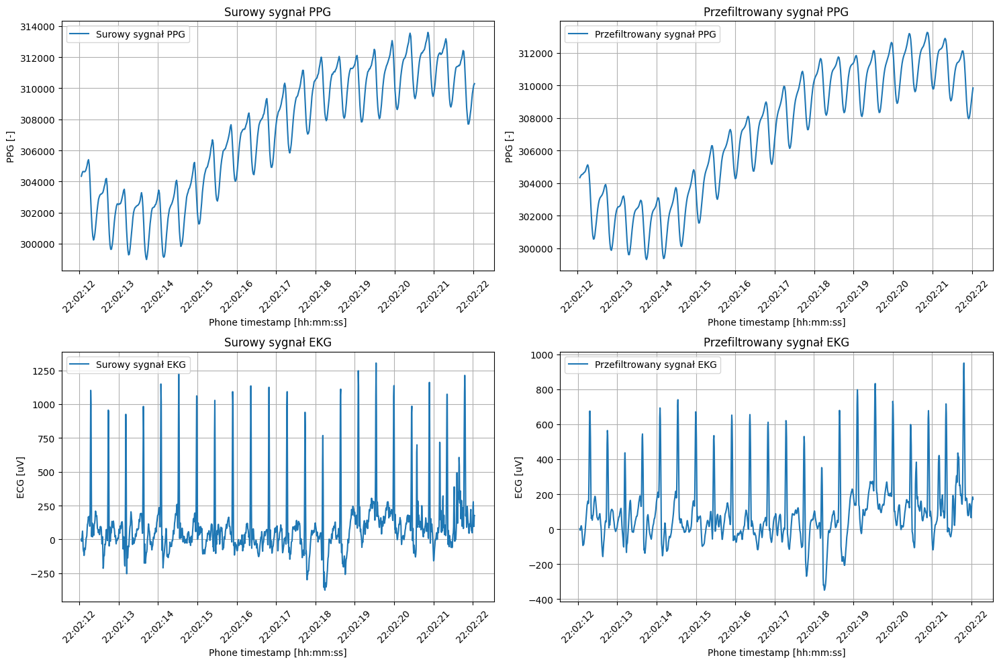

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


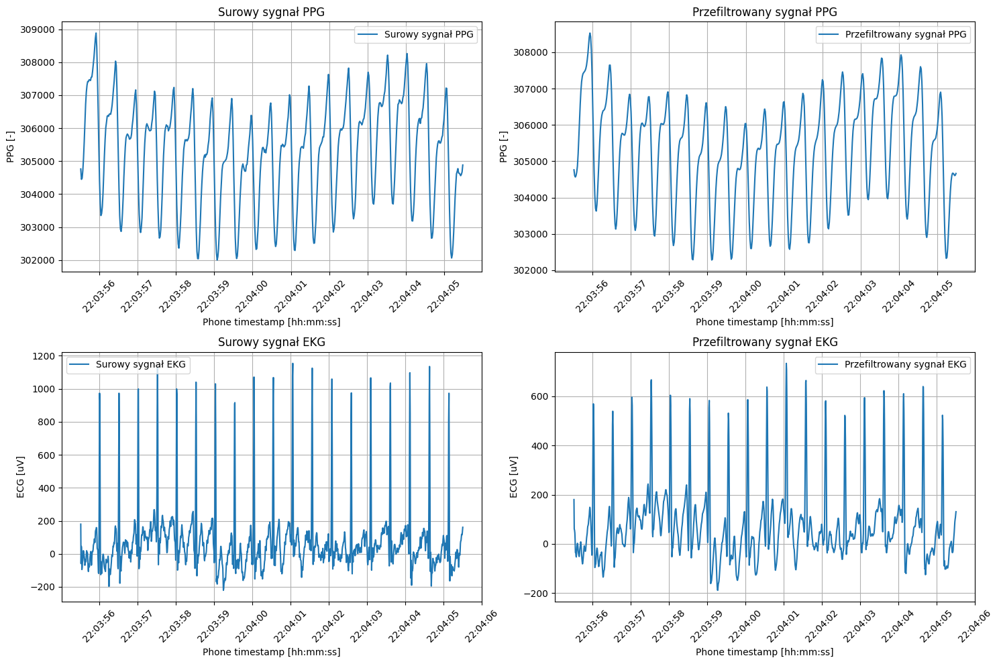

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


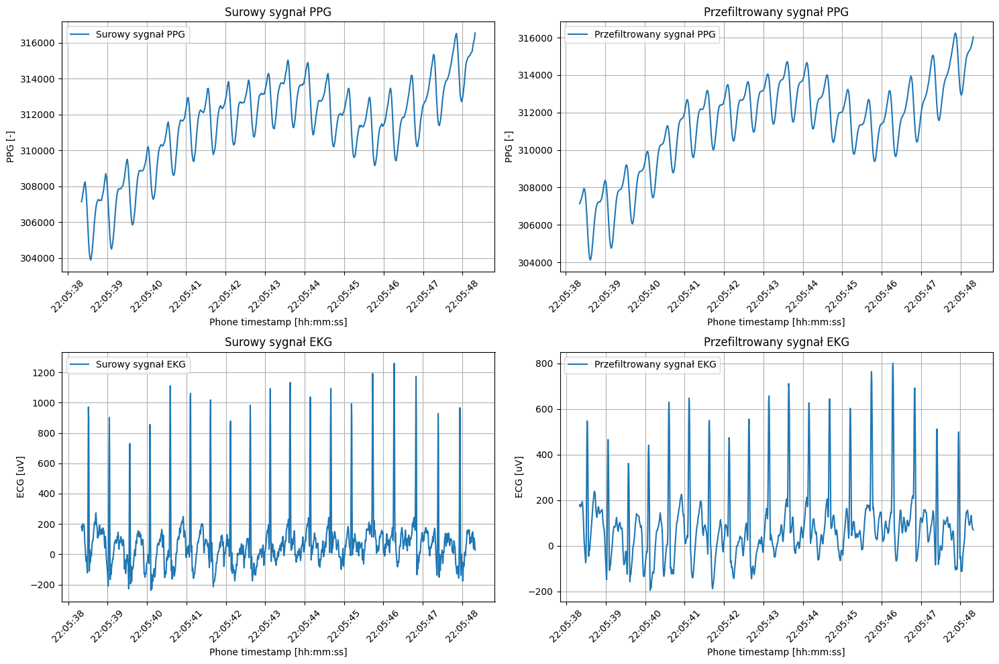

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


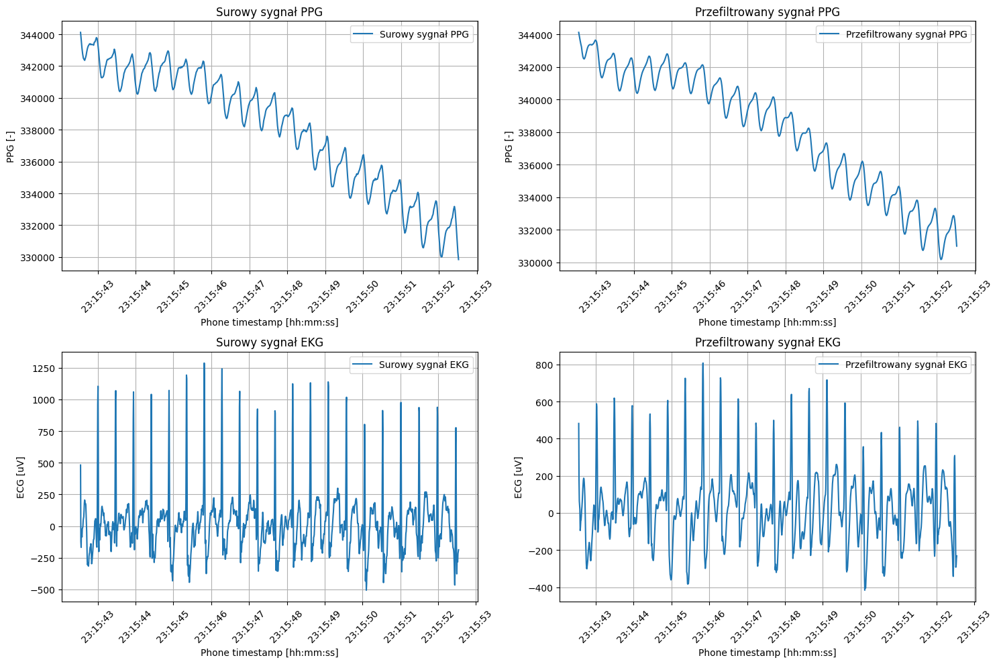

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


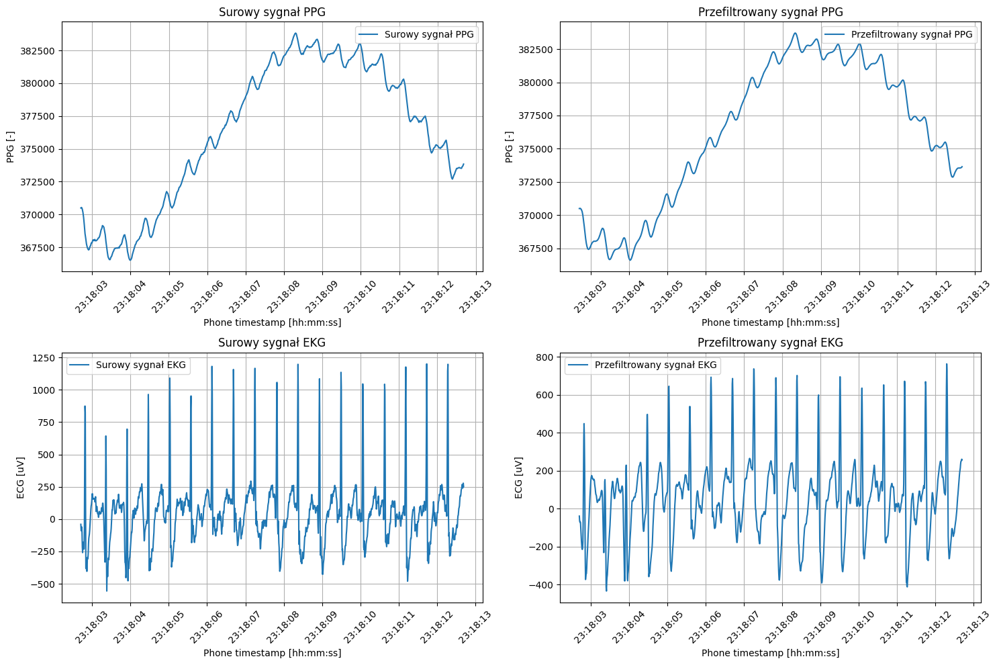

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


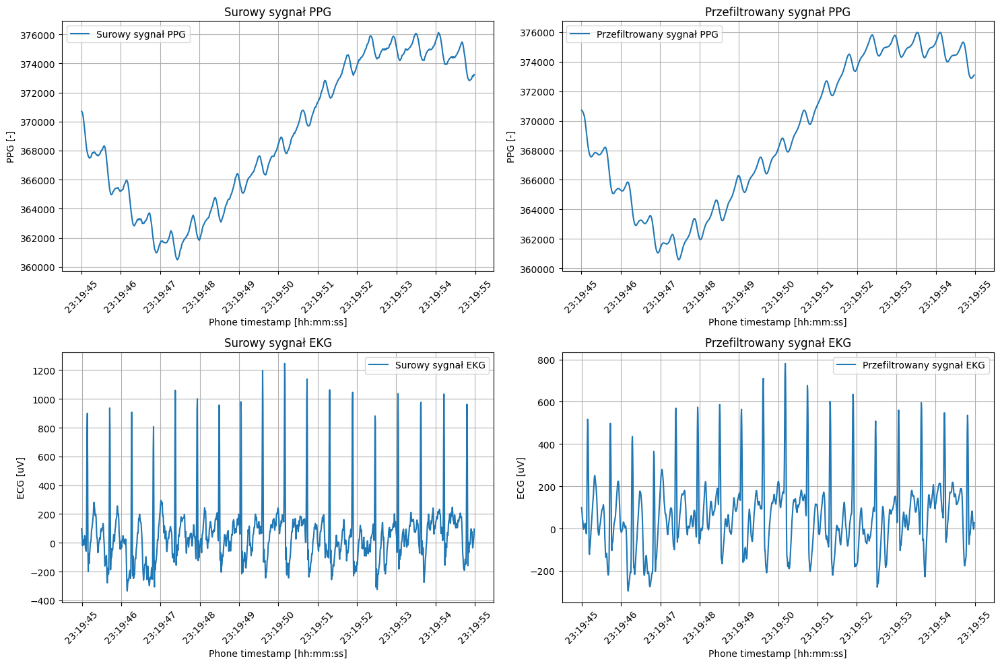

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


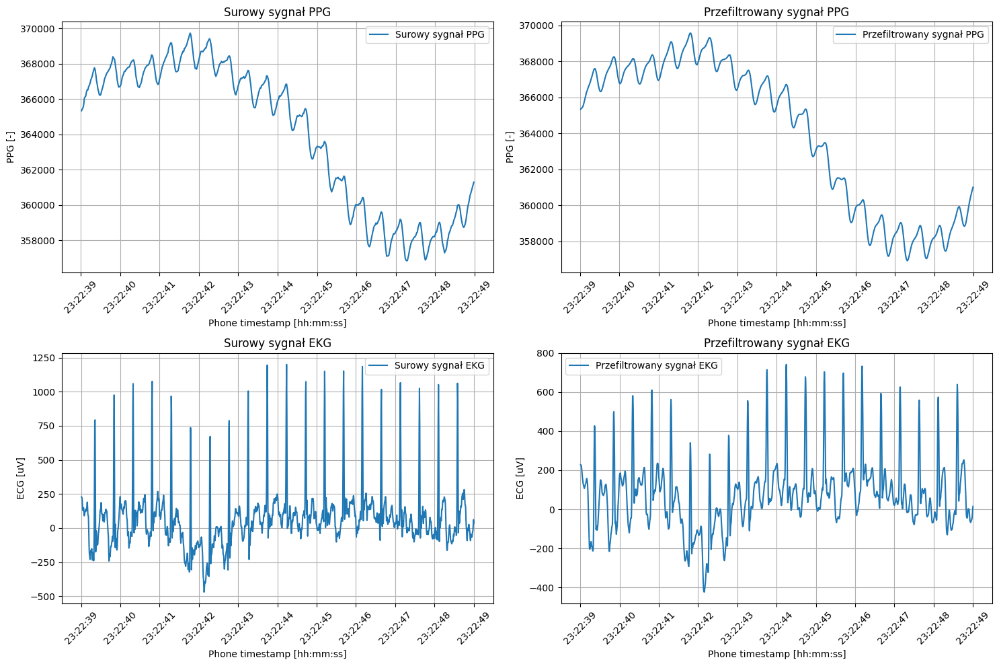

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


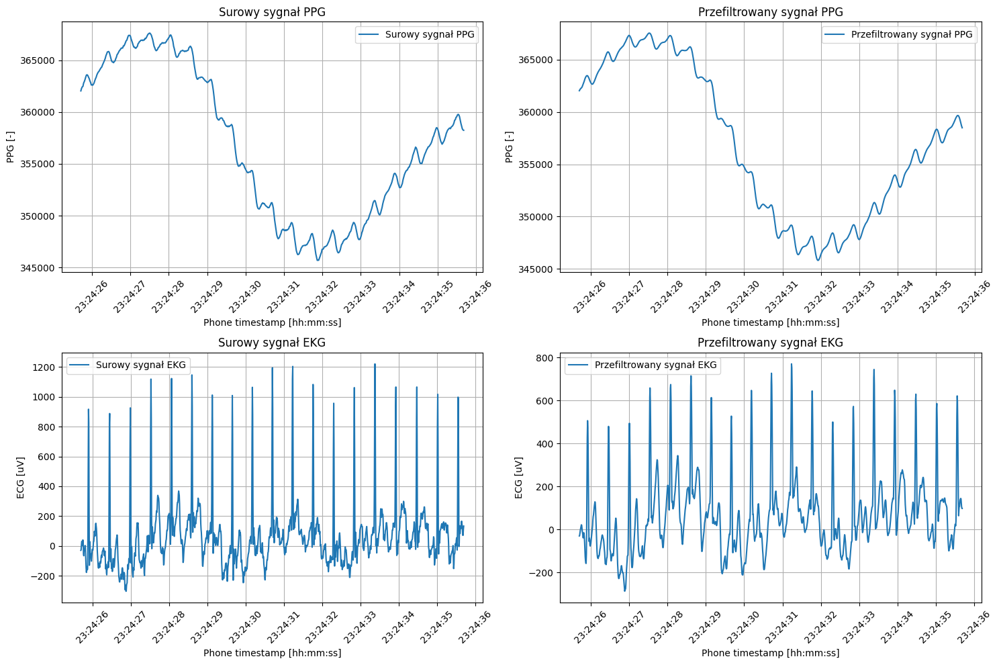

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


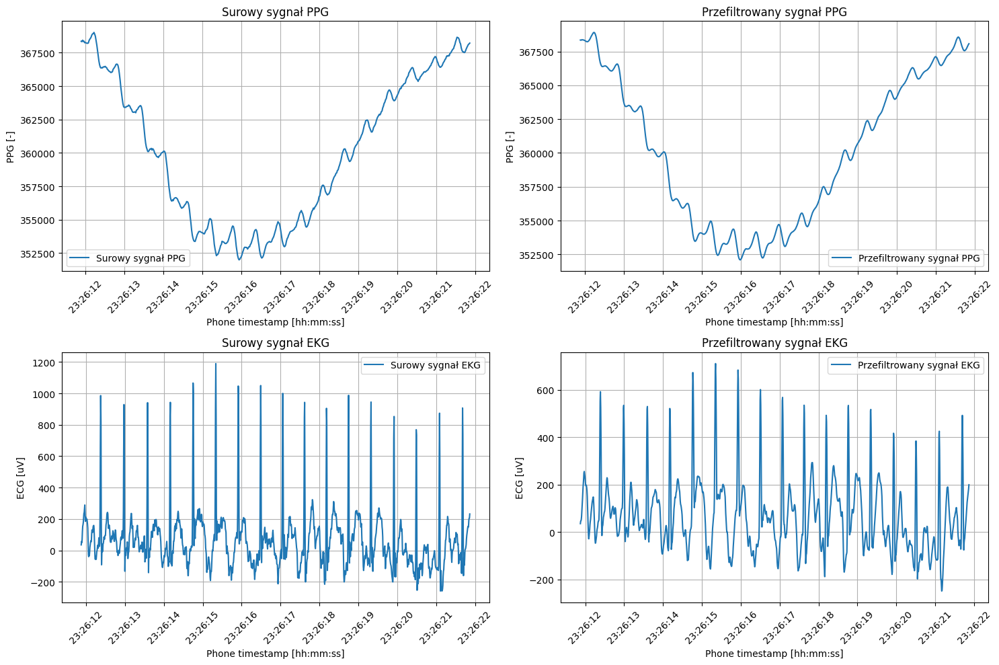

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


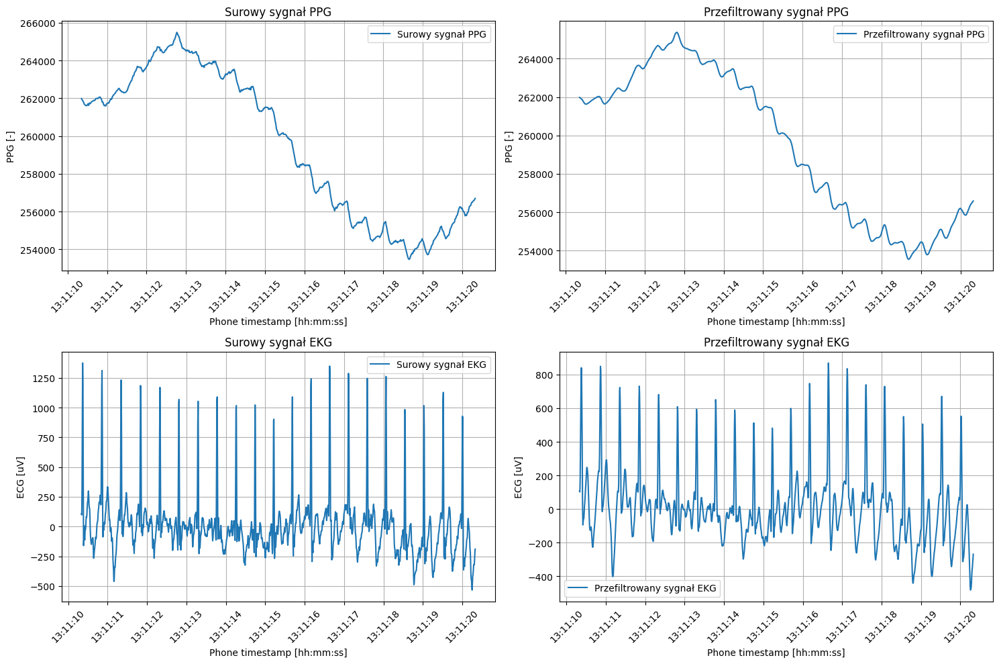

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


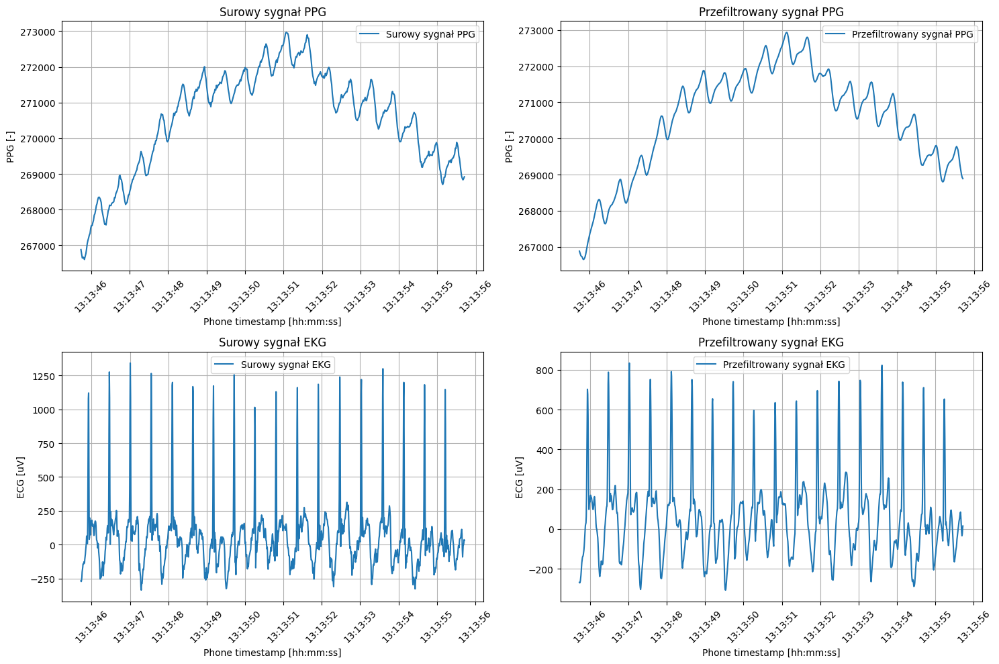

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


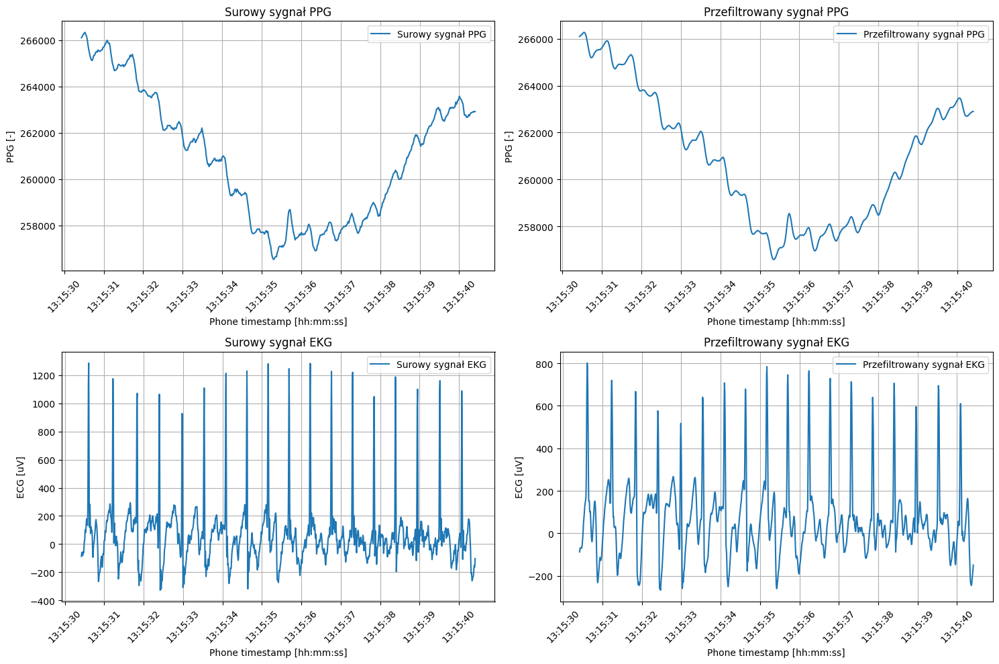

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


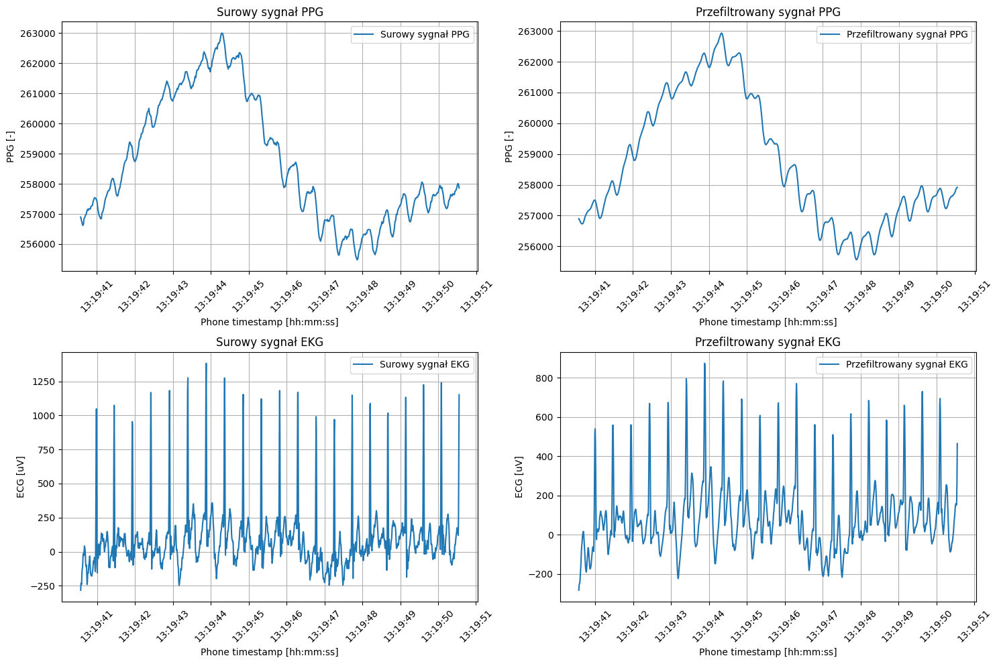

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


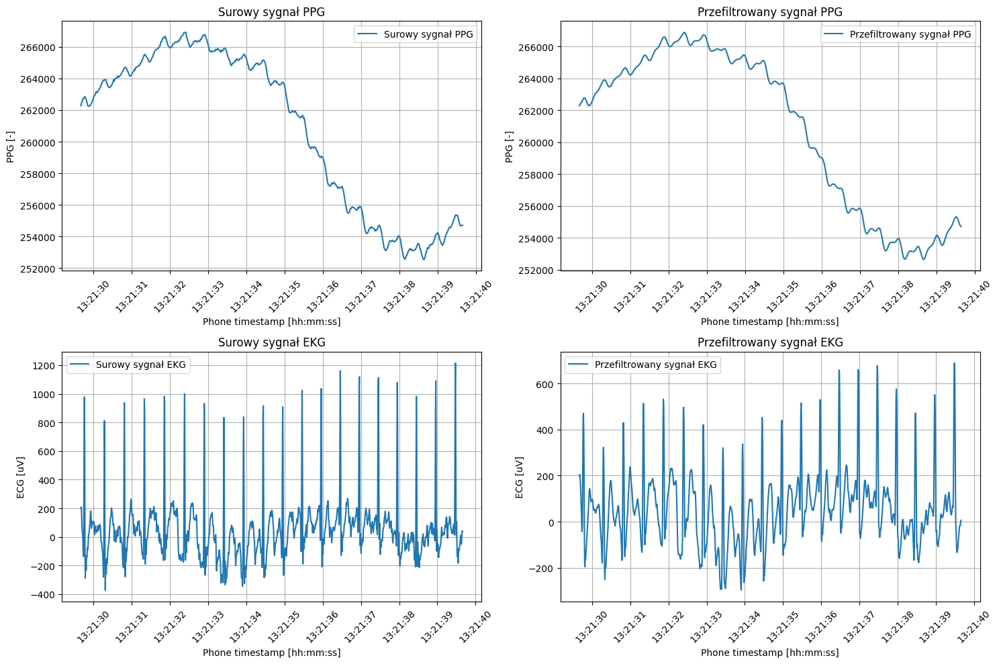

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


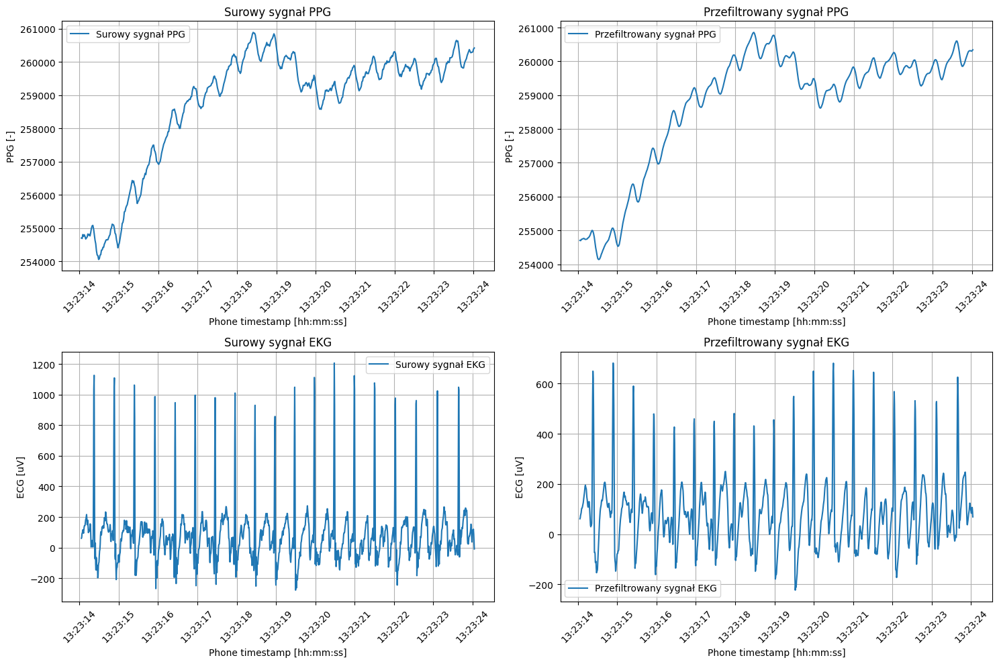

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


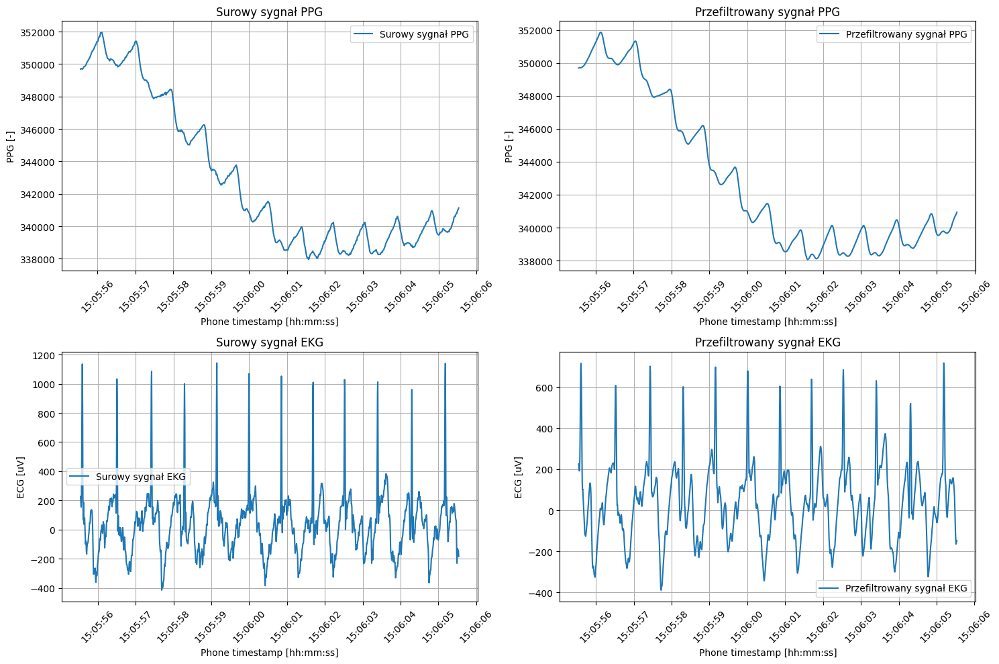

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


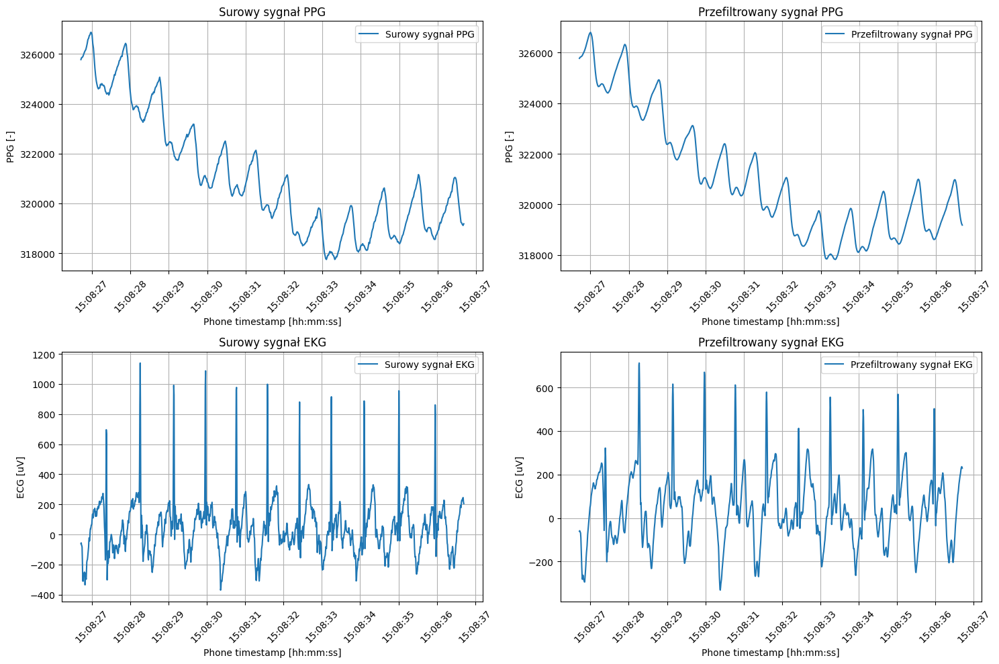

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


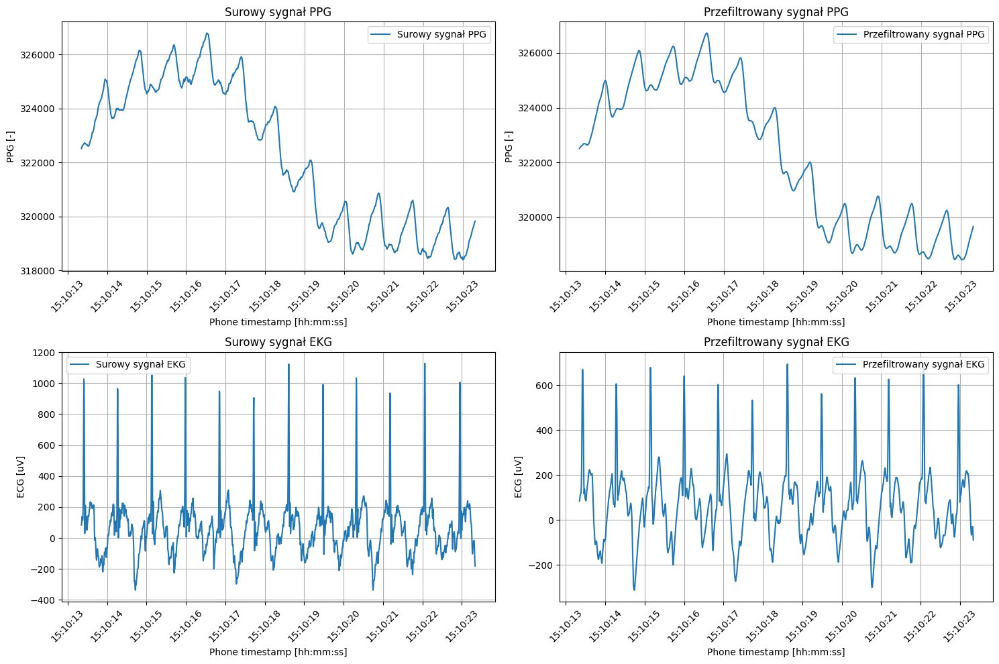

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


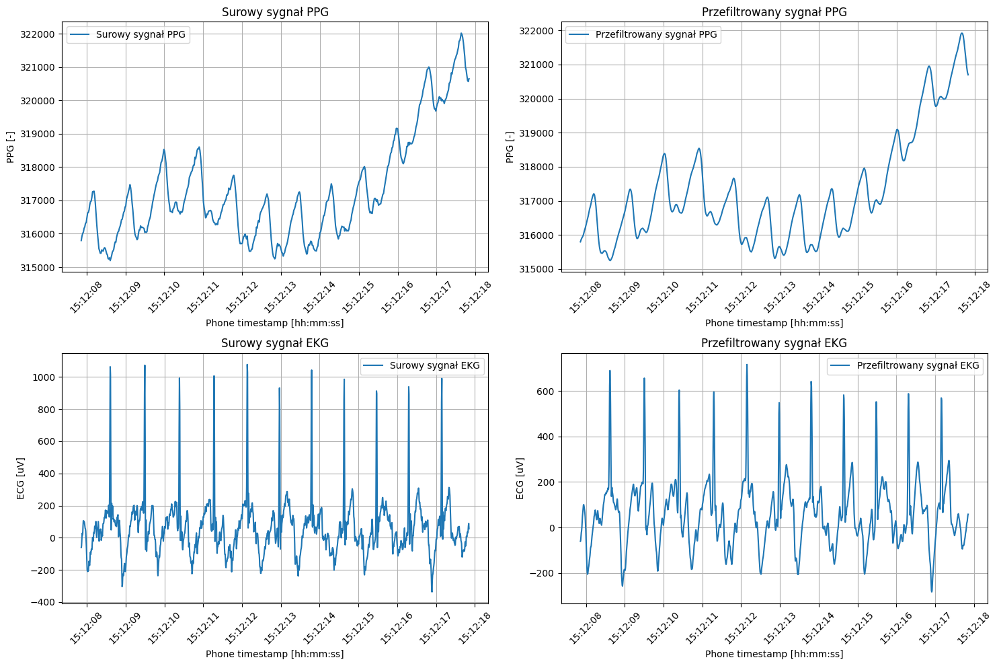

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


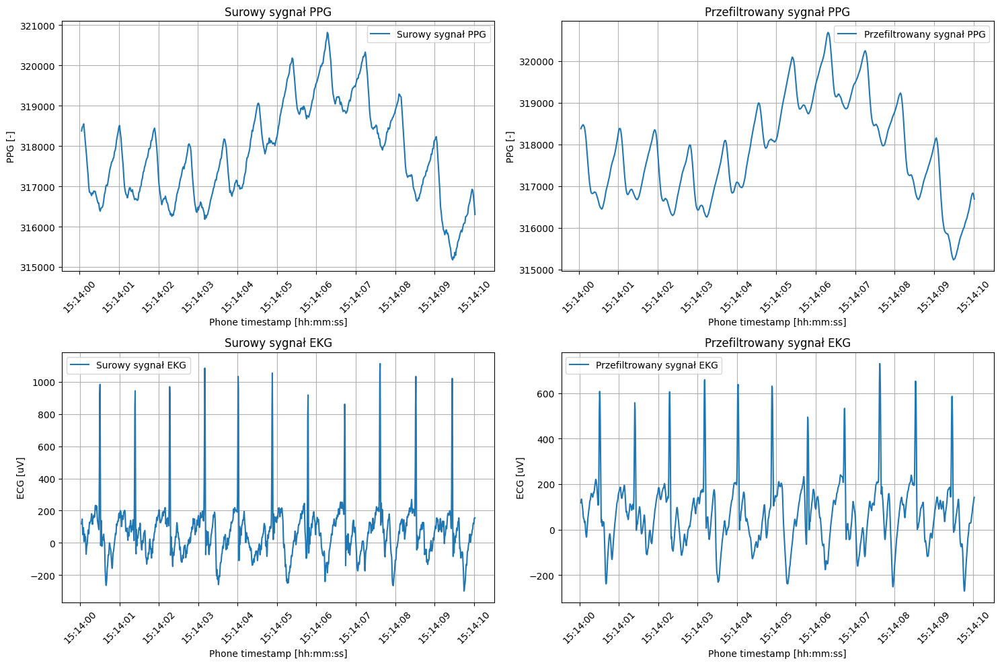

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


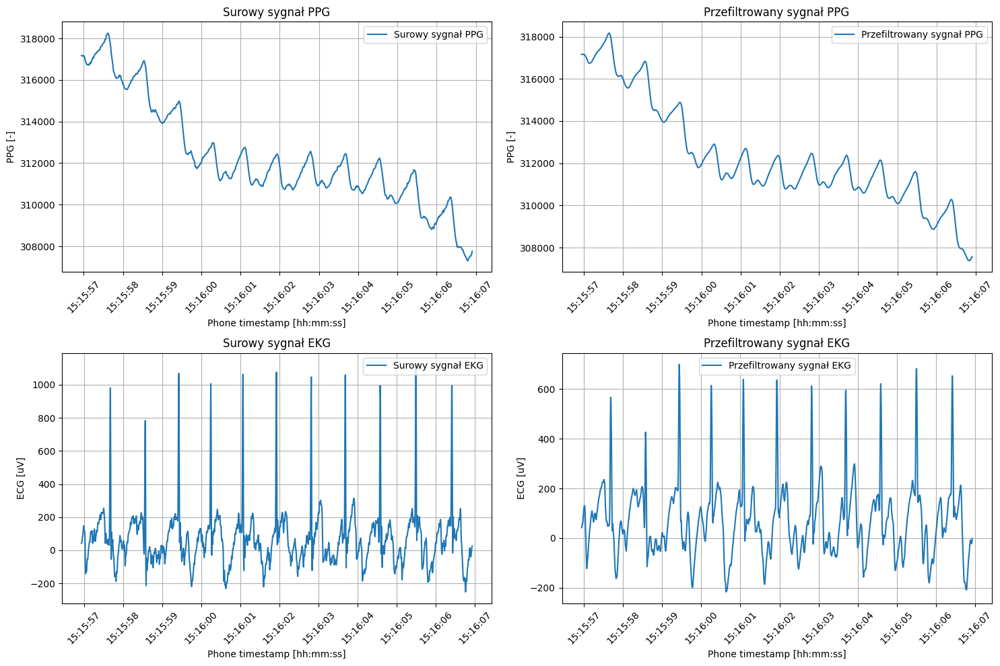

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


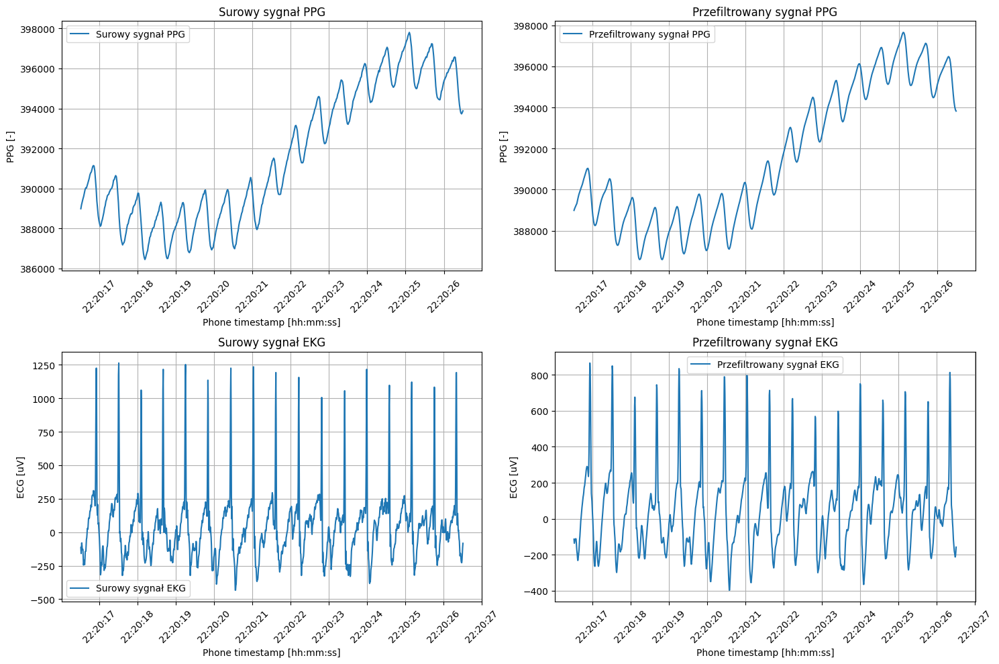

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


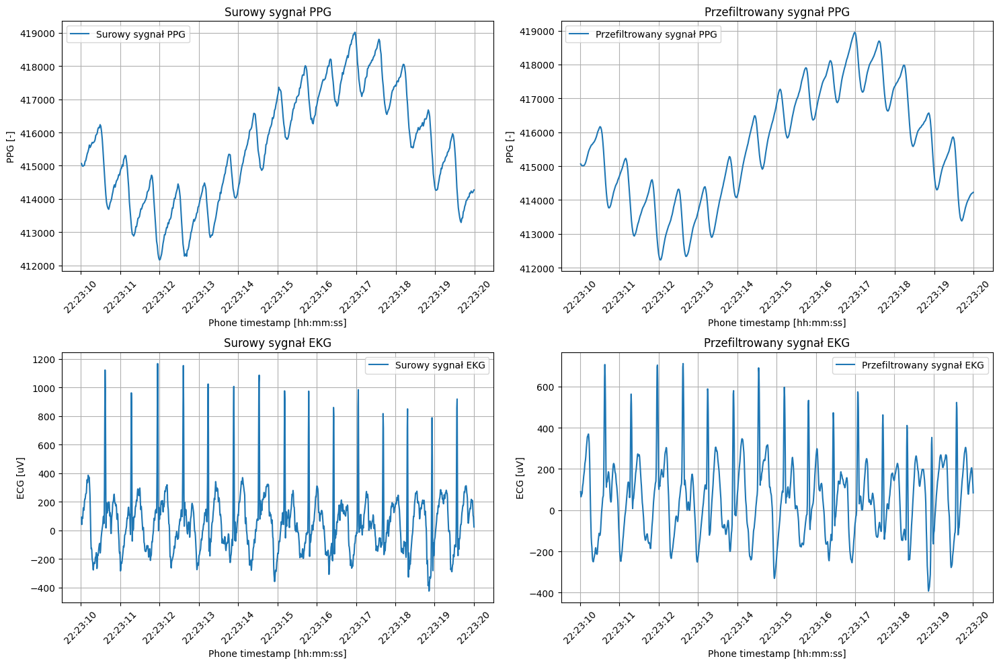

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


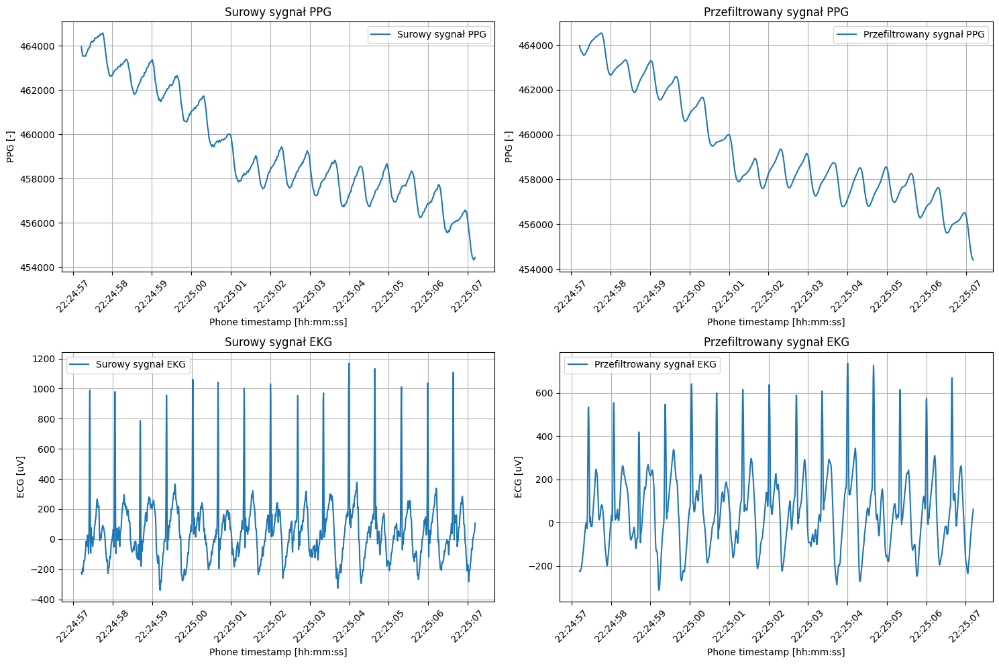

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


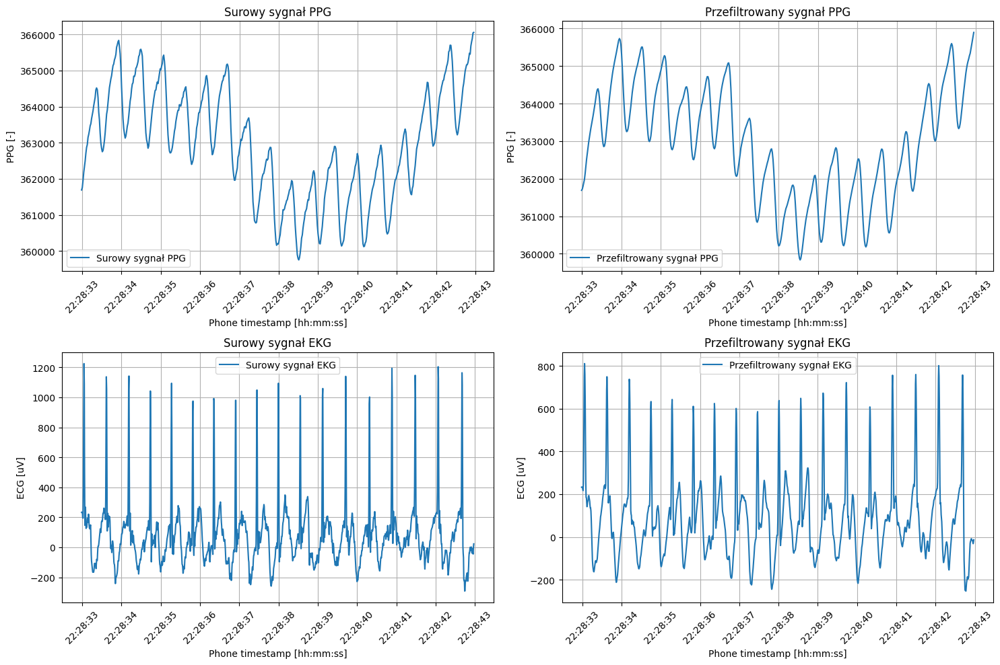

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


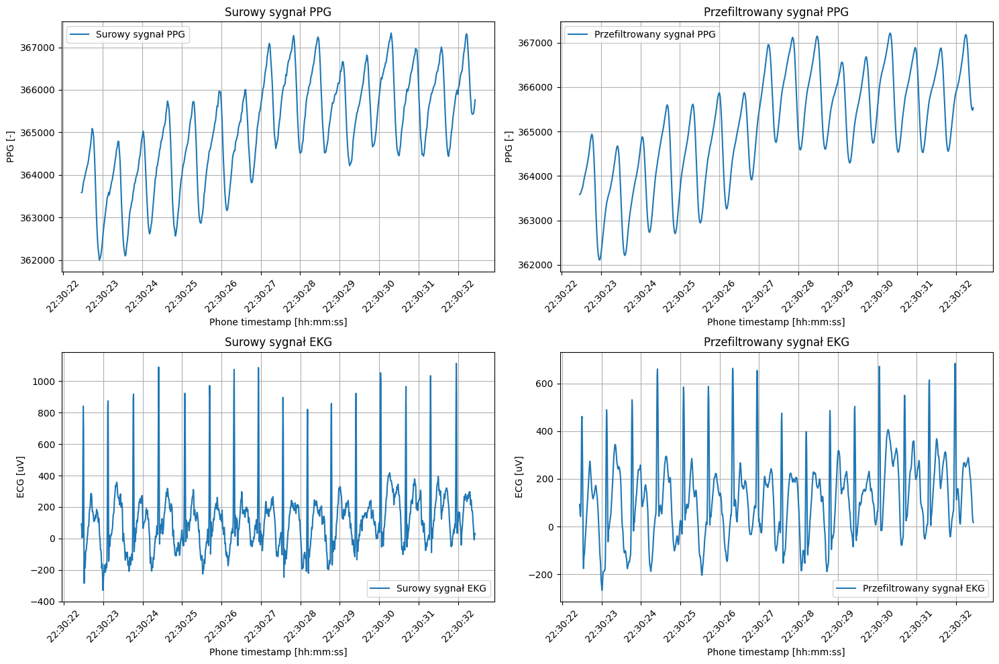

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


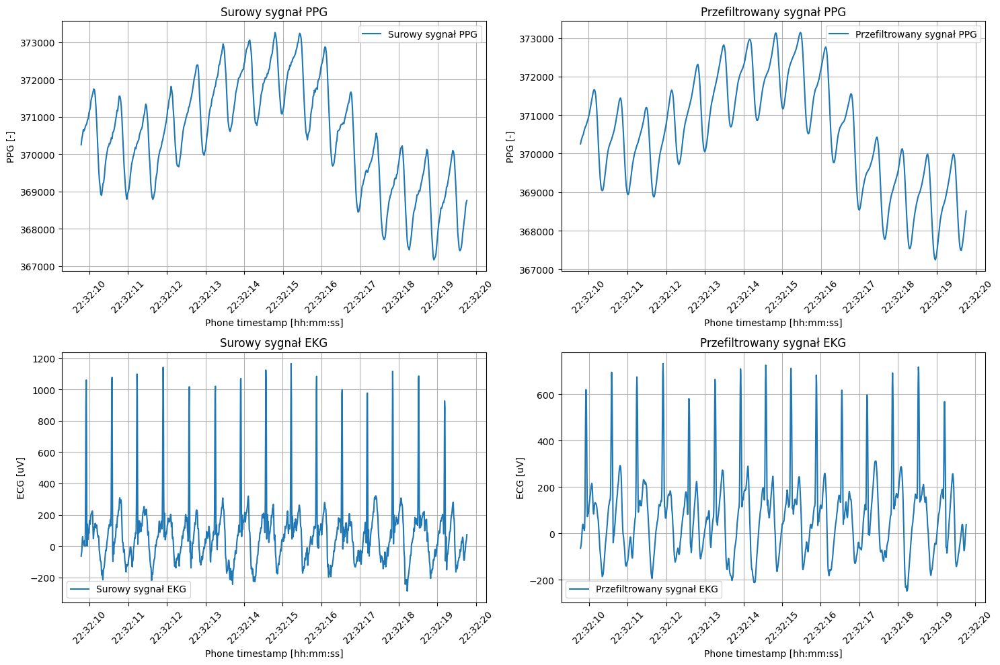

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


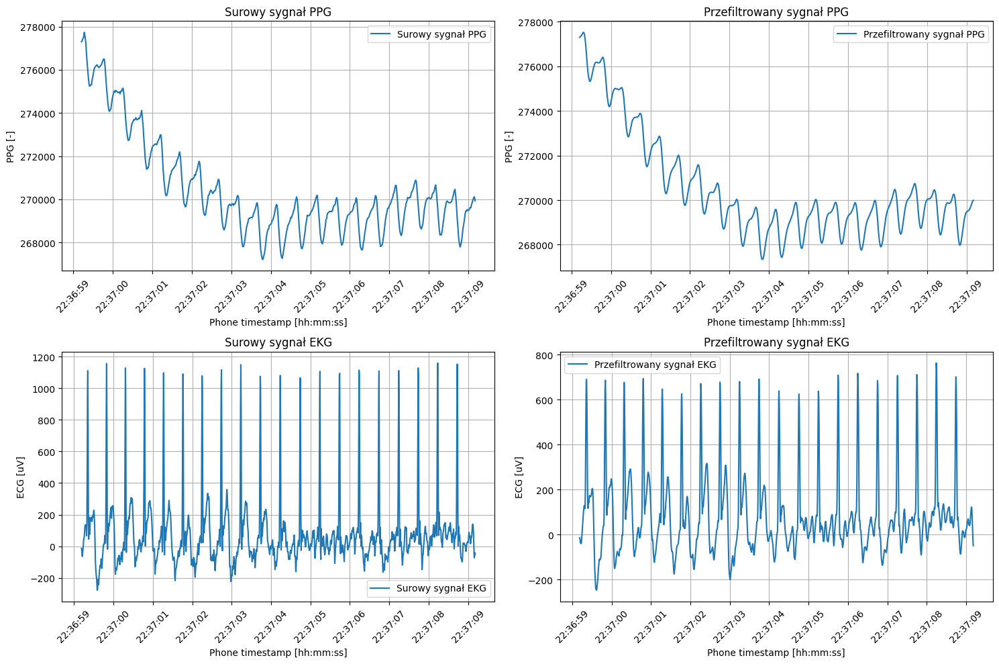

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


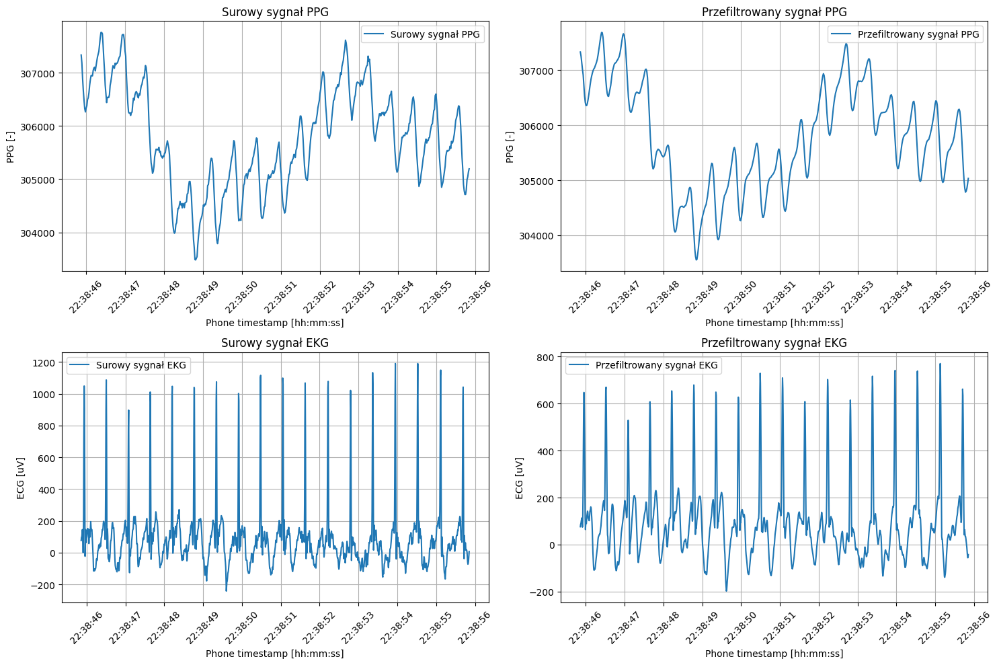

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


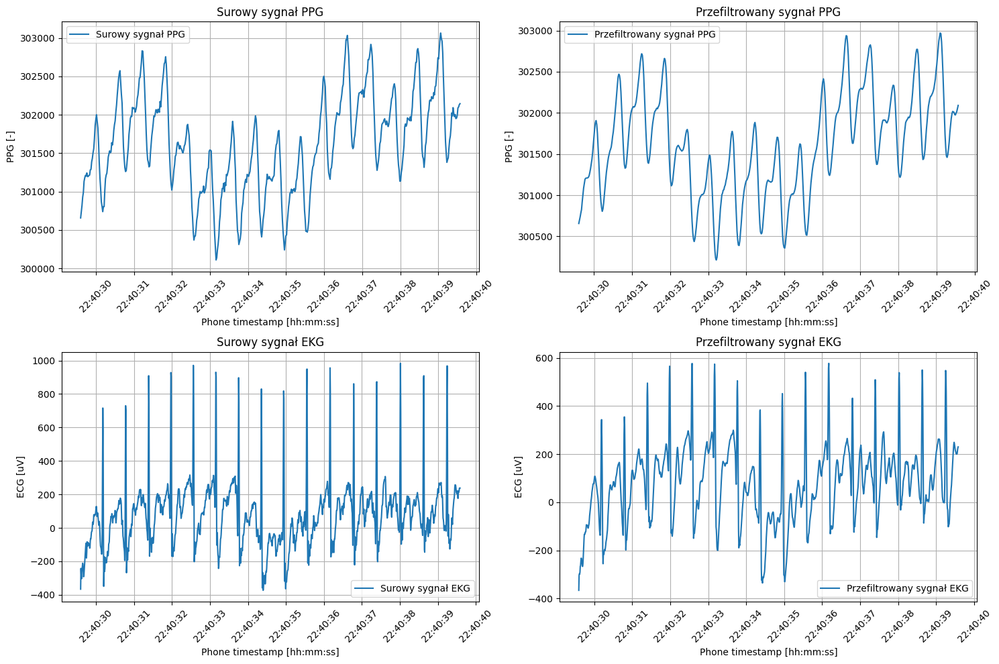

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


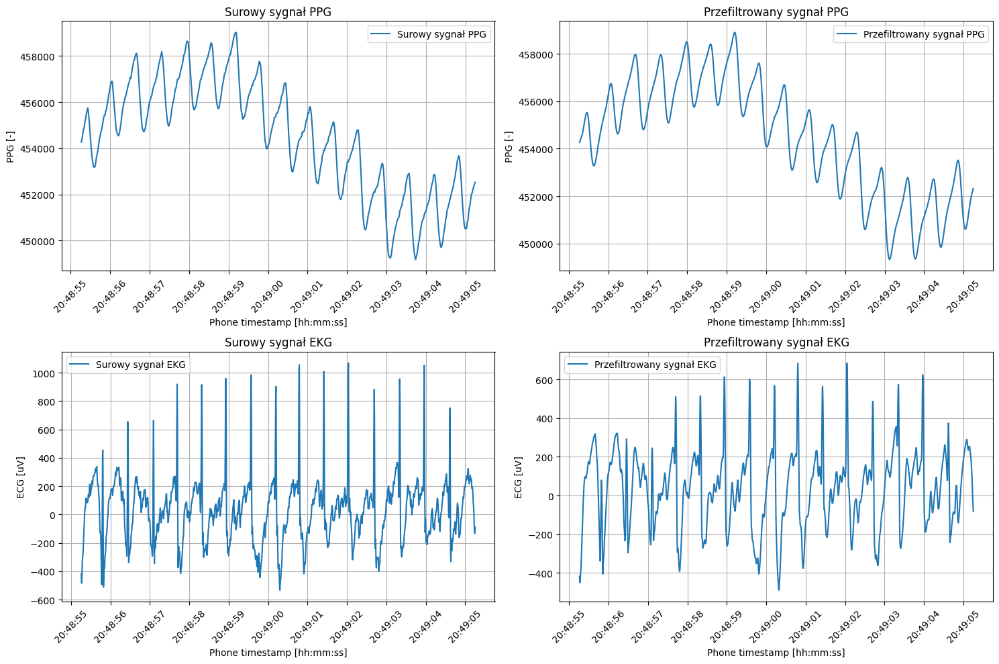

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


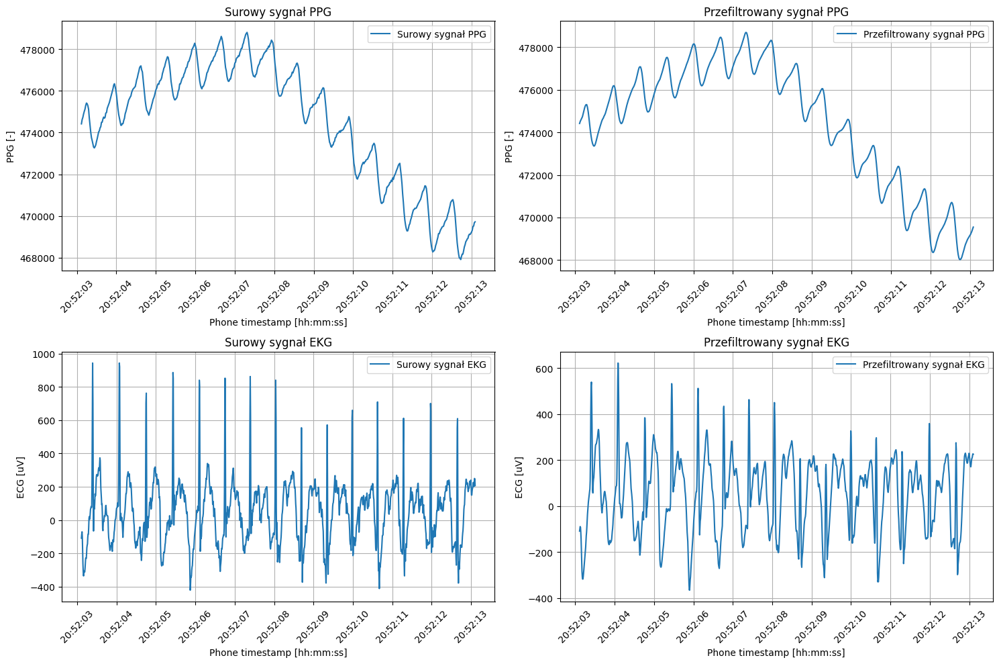

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


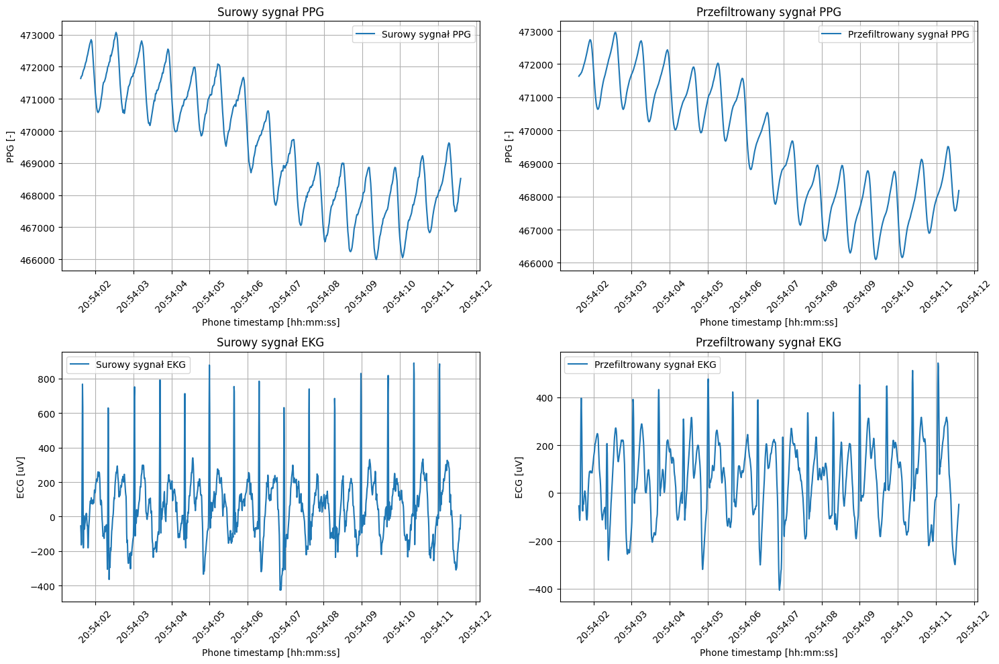

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


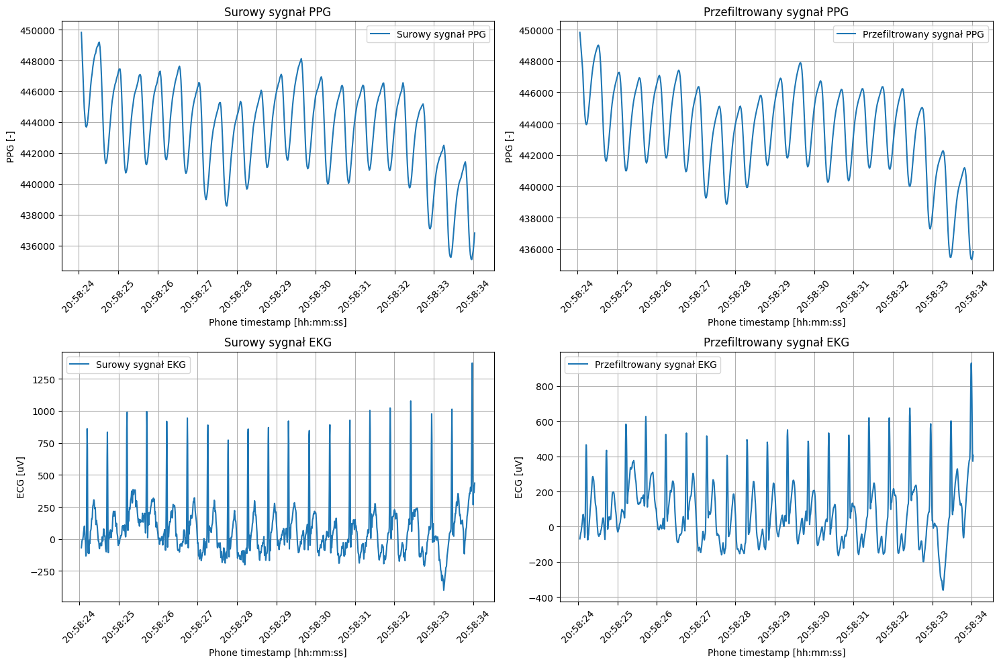

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


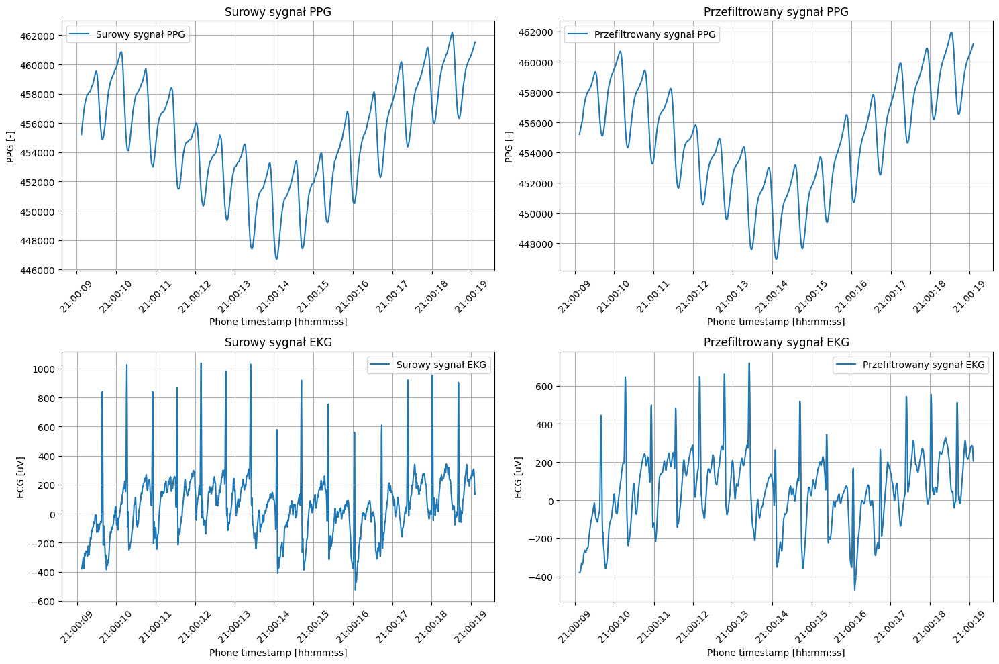

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


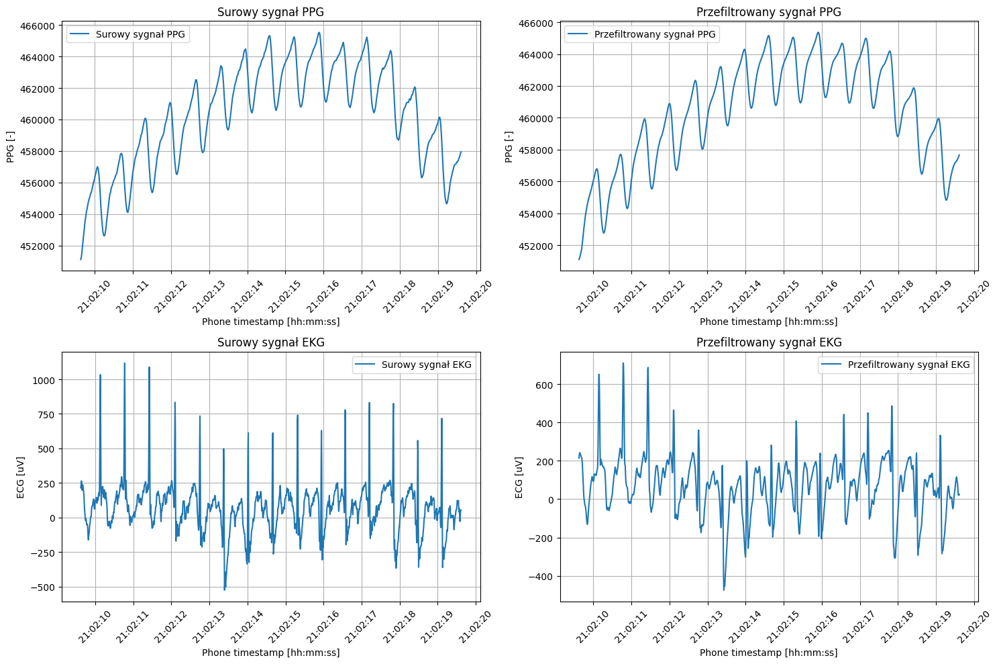

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


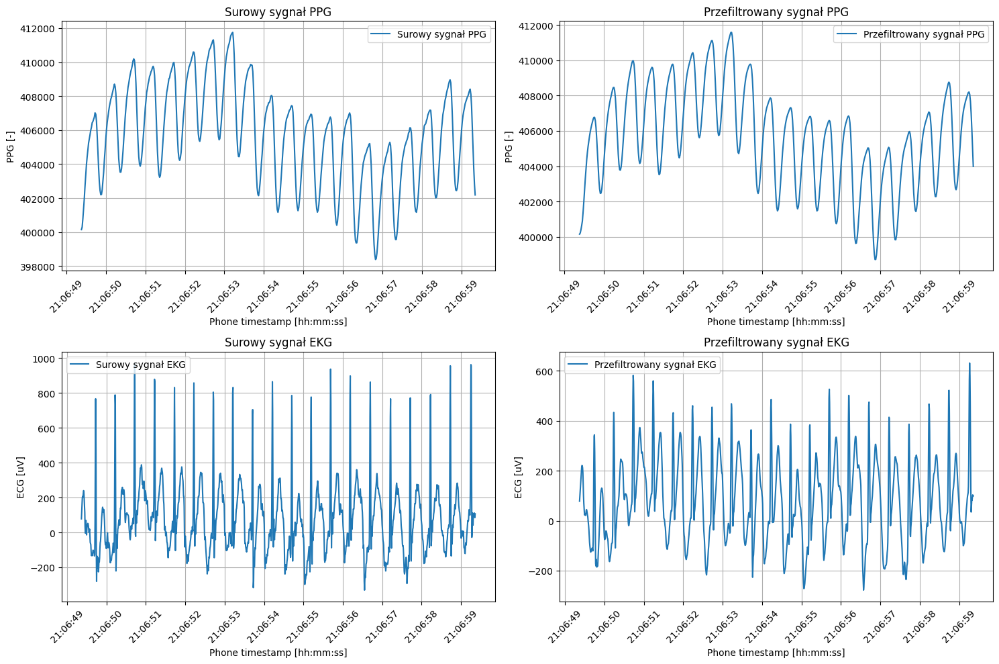

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


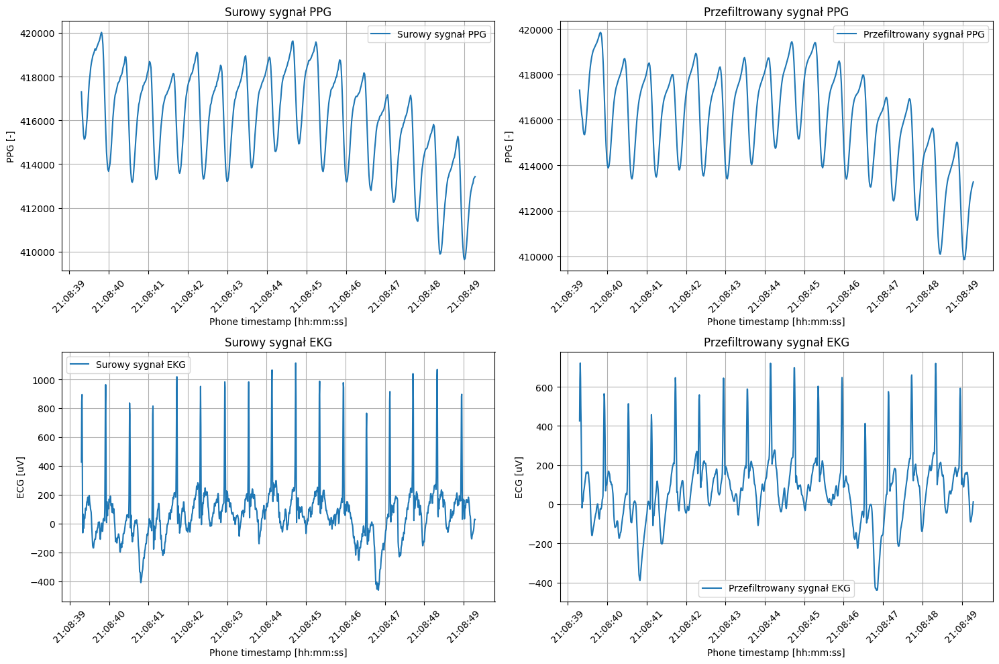

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


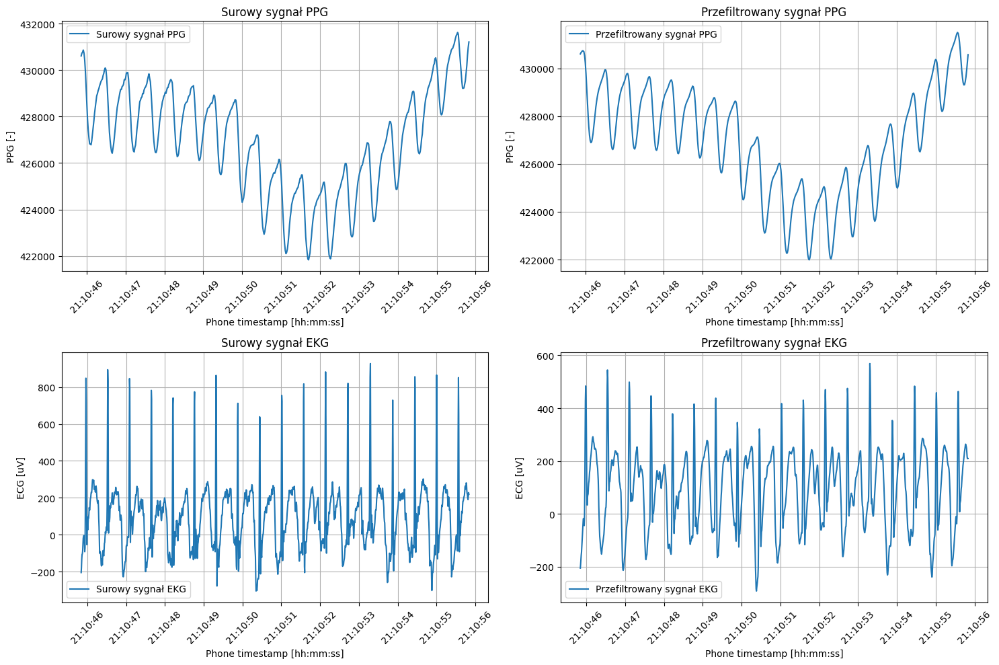

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


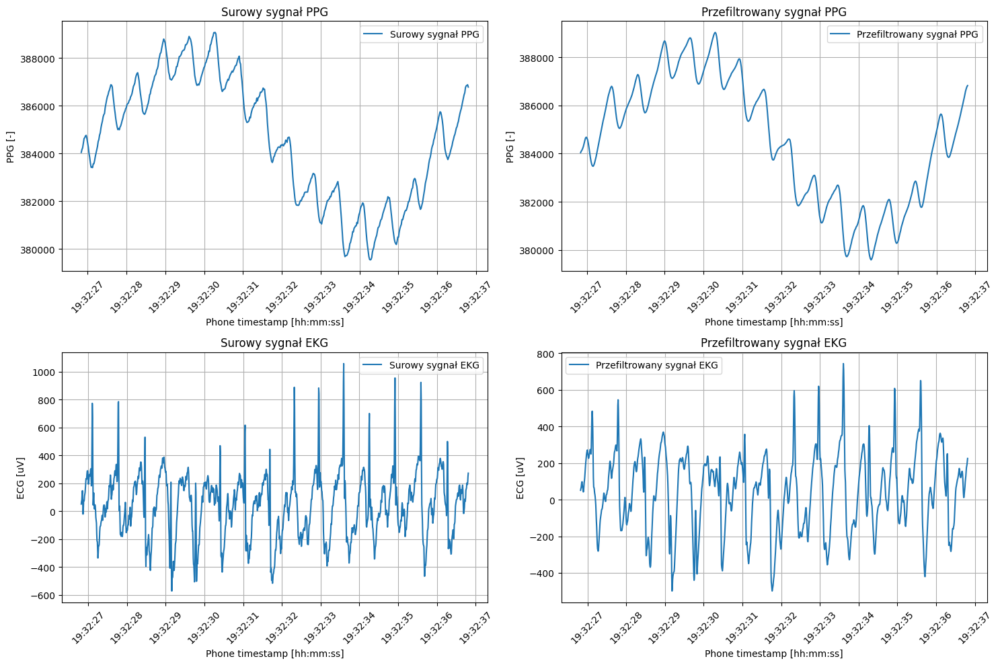

/tmp/ipykernel_1508560/1517358423.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()
/tmp/ipykernel_1508560/1517358423.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()


KeyboardInterrupt: 

In [5]:
import os
import pandas as pd
from datetime import datetime
import re
import matplotlib.pyplot as plt

ECG_PERCEMTAGE_START = 0.8

ECG_WINDOW = 130 * 10
PPG_WINDOW = 55 * 10

PPG_CHANNEL = 'channel 0'
FILTERED_WINDOW = 5  # Szerokość okna filtru ruchomej średniej

def filter_data_window(data_window, filtered_window):
    if len(data_window) > filtered_window:
        filtered_data_window = data_window.head(filtered_window)
    else:
        padding = filtered_window - len(data_window)
        zeros_df = pd.DataFrame(0, index=range(padding), columns=data_window.columns)
        filtered_data_window = pd.concat([data_window, zeros_df])
    return filtered_data_window

def generate_column_names(ecg_count, ppg_count):
    ecg_columns = [f'ECG_{i}' for i in range(1, ecg_count + 1)]
    ppg_columns = [f'PPG_{i}' for i in range(1, ppg_count + 1)]
    column_names = ['Filename'] + ecg_columns + ppg_columns
    return column_names

def repair_PPG(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
    cleaned_data = []
    for line in lines[1:]:
        if line.strip():
            fields = line.strip().rstrip(';').split(';')
            cleaned_data.append(fields)
    column_names = lines[0].strip().split(';')
    df = pd.DataFrame(cleaned_data, columns=column_names)
    df[['channel 0', 'channel 1', 'channel 2', 'ambient']] = df[['channel 0', 'channel 1', 'channel 2', 'ambient']].apply(pd.to_numeric)
    df['channel 0'] -= df['ambient']
    df['channel 1'] -= df['ambient']
    df['channel 2'] -= df['ambient']
    df['main_channel'] = df[PPG_CHANNEL]
    df = df.drop(columns=["sensor timestamp [ns]", "channel 0", "channel 1", "channel 2", "ambient"])
    df['Phone timestamp'] = pd.to_datetime(df['Phone timestamp'], format='%Y-%m-%dT%H:%M:%S.%f')
    return df

def parse_filename(filename):
    match = re.match(r"(\d{2}_\d{2}_\d{2})_(\w+)_(\d+)_(ECG|PPG)\.txt", filename)
    if match:
        date_str, name, index, type_ = match.groups()
        date = datetime.strptime(date_str, '%d_%m_%y')
        return date, name, int(index), type_
    else:
        return None

def get_sorted_files(directory):
    if os.path.exists(directory) and os.path.isdir(directory):
        files = [filename for filename in os.listdir(directory) if os.path.isfile(os.path.join(directory, filename))]
        files = [f for f in files if parse_filename(f)]
        files.sort(key=lambda x: parse_filename(x))
        return files
    return []

# Specify the paths to polar_data directory
polar_data_dir = 'polar_data'

# Get sorted list of filenames from polar_ECG directory
ecg_dir = os.path.join(polar_data_dir, 'polar_ECG')
ecg_files = get_sorted_files(ecg_dir)

# Get sorted list of filenames from polar_PPG directory
ppg_dir = os.path.join(polar_data_dir, 'polar_PPG')
ppg_files = get_sorted_files(ppg_dir)

# Determine the maximum length between ecg_files and ppg_files
max_length = max(len(ecg_files), len(ppg_files))

merged_dataframe_to_save = pd.DataFrame(columns=generate_column_names(ECG_WINDOW, PPG_WINDOW))

# Iterate through both lists simultaneously
for i in range(max_length):

    ################## ECG ##################

    ECG_data = pd.read_csv(f"polar_data/polar_ECG/{ecg_files[i]}", delimiter=";")

    ECG_data = ECG_data.drop(columns=["sensor timestamp [ns]", "timestamp [ms]"])

    ECG_data['Phone timestamp'] = pd.to_datetime(ECG_data['Phone timestamp'], format='%Y-%m-%dT%H:%M:%S.%f')

    cut_ECG_data = int(ECG_PERCEMTAGE_START * len(ECG_data))
    start_index_ECG = cut_ECG_data
    end_index_ECG = start_index_ECG + ECG_WINDOW
    end_index_ECG = min(end_index_ECG, len(ECG_data))
    ECG_data_window = ECG_data.iloc[start_index_ECG:end_index_ECG]

    # Apply moving average filter
    ECG_data_window['filtered_ecg'] = ECG_data_window['ecg [uV]'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()

    ################## PPG ##################
    
    PPG_data = repair_PPG(f"polar_data/polar_PPG/{ppg_files[i]}")
    PPG_data = PPG_data[PPG_data['Phone timestamp'] >= ECG_data_window.iloc[0]["Phone timestamp"]]
    PPG_data_window = PPG_data.head(PPG_WINDOW)
    # main_channel_mean = PPG_data_window['main_channel'].mean()
    # PPG_data_window.loc[:, 'main_channel'] = (PPG_data_window['main_channel'] - main_channel_mean) / 1000
    # PPG_data_window.loc[:, 'main_channel'] = PPG_data_window['main_channel'].round(3)

    # Apply moving average filter
    PPG_data_window['filtered_main_channel'] = PPG_data_window['main_channel'].rolling(window=FILTERED_WINDOW, min_periods=1).mean()

    ################## PLOT DATA ##################
    # Create subplots for before and after filtering
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))

    # Plot original and filtered PPG data
    axs[0, 0].plot(PPG_data_window['Phone timestamp'], PPG_data_window['main_channel'], label='Surowy sygnał PPG')
    axs[0, 0].set_title('Surowy sygnał PPG')
    axs[0, 0].set_xlabel('Phone timestamp [hh:mm:ss]')
    axs[0, 0].set_ylabel('PPG [-]')
    axs[0, 0].legend()
    axs[0, 0].grid(True)
    axs[0, 0].tick_params(axis='x', rotation=45)  # Rotate x-axis labels

    axs[0, 1].plot(PPG_data_window['Phone timestamp'], PPG_data_window['filtered_main_channel'], label='Przefiltrowany sygnał PPG')
    axs[0, 1].set_title('Przefiltrowany sygnał PPG')
    axs[0, 1].set_xlabel('Phone timestamp [hh:mm:ss]')
    axs[0, 1].set_ylabel('PPG [-]')
    axs[0, 1].legend()
    axs[0, 1].grid(True)
    axs[0, 1].tick_params(axis='x', rotation=45)  # Rotate x-axis labels

    # Plot original and filtered ECG data
    axs[1, 0].plot(ECG_data_window['Phone timestamp'], ECG_data_window['ecg [uV]'], label='Surowy sygnał EKG')
    axs[1, 0].set_title('Surowy sygnał EKG')
    axs[1, 0].set_xlabel('Phone timestamp [hh:mm:ss]')
    axs[1, 0].set_ylabel('ECG [uV]')
    axs[1, 0].legend()
    axs[1, 0].grid(True)
    axs[1, 0].tick_params(axis='x', rotation=45)  # Rotate x-axis labels

    axs[1, 1].plot(ECG_data_window['Phone timestamp'], ECG_data_window['filtered_ecg'], label='Przefiltrowany sygnał EKG')
    axs[1, 1].set_title('Przefiltrowany sygnał EKG')
    axs[1, 1].set_xlabel('Phone timestamp [hh:mm:ss]')
    axs[1, 1].set_ylabel('ECG [uV]')
    axs[1, 1].legend()
    axs[1, 1].grid(True)
    axs[1, 1].tick_params(axis='x', rotation=45)  # Rotate x-axis labels

    plt.tight_layout()
    plt.show()
